# Pre-OPAL Image Mapper
This notebook generates the image maps for the Pre-OPAL Hubble Images. The processes used to generate this data are:-
- Download a representative image for every filter and every year of data collection back to 2000 from the MAST Archive
- Starting with WFC3 Most Recent Images, travelling backwards in time
- Use the mapping methods found in "Mapping Code Testing" to generate maps for each image
- Save the maps as a .png for easy distribution, and as a .fits for reflectance analysis

Important Notes:-
- Pre OPAL beginning, there was a break in taking data of Neptune, HST didn't aim at it between the years of 2011 and 2015
- Single Year Gaps in 2003 and 1999
- Otherwise, this notebook goes all the way back to 1994, when the WPFC2 Camera was installed on HST. 

In [1]:
#RUN ME BEFORE ANYTHING ELSE!!! I import all of the required modules and functions!!
import matplotlib.pyplot as plt
%matplotlib inline
plt.ion()
print('Imported and initialised matplotlib...')
import astropy.io.fits as ast
print('Imported Astropy...')
from MapFunc import *
print('Imported User Defined Functions...')
from tools.mapping import *
from tools.image import *
print("Imported Oliver King's tools, v1.4 ...")
col = 'viridis'
xcol = 'red'
lvls = 1000
print("Graphical Parameters initialised...")
print('All Modules Imported Successfully!')

import csv
csv_467 = 'plotdata/467_time.csv'       
writer467 = csv.writer(open(csv_467, mode='w'), delimiter=',')
csv_547 = 'plotdata/547_time.csv'
writer547 = csv.writer(open(csv_547, mode='w'), delimiter=',')
csv_619 = 'plotdata/619_time.csv'
writer619 = csv.writer(open(csv_619, mode='w'), delimiter=',')
csv_657 = 'plotdata/657_time.csv'
writer657 = csv.writer(open(csv_657, mode='w'), delimiter=',')
csv_727 = 'plotdata/727_time.csv'
writer727 = csv.writer(open(csv_727, mode='w'), delimiter=',')
csv_763 = 'plotdata/763_time.csv'
writer763 = csv.writer(open(csv_763, mode='w'), delimiter=',')
csv_845 = 'plotdata/845_time.csv'
writer845 = csv.writer(open(csv_845, mode='w'), delimiter=',')
print('.csv writers intitialised.')

Imported and initialised matplotlib...
Imported Astropy...
Imported User Defined Functions...
Imported Oliver King's tools, v1.4 ...
Graphical Parameters initialised...
All Modules Imported Successfully!
.csv writers intitialised.


# Year 2020
OPAL YEAR: ALL FILTERS AVAILABLE, using imageset of rotation

1.6967164e-18
1.6967164e-18


C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


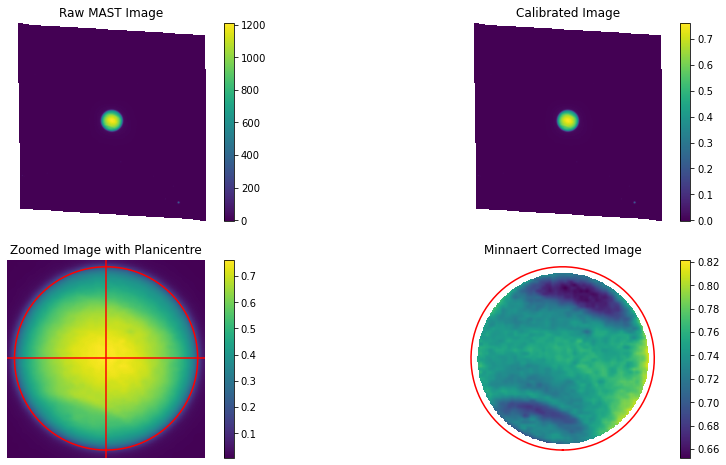

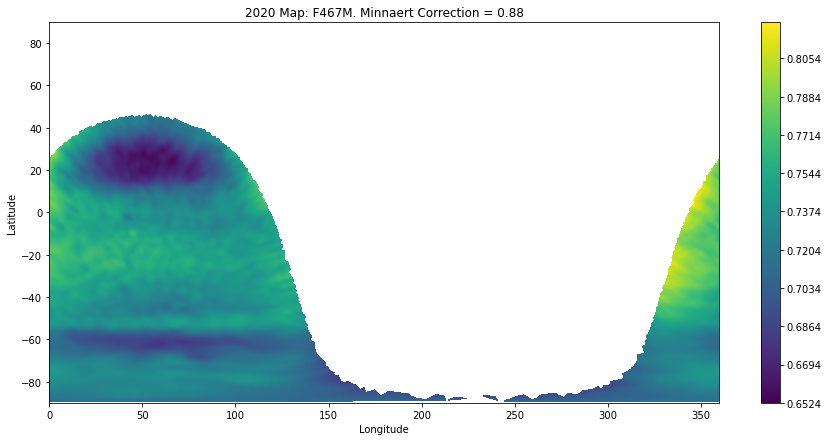

16

In [2]:
mfac = 0.88

img, hdr, scihdr = open_img('data/2020/467/ie0l24pdq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

print(hdr['PHOTFLAM'])
print(scihdr['PHOTFLAM'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 2019.04)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2020 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2020/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2020/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


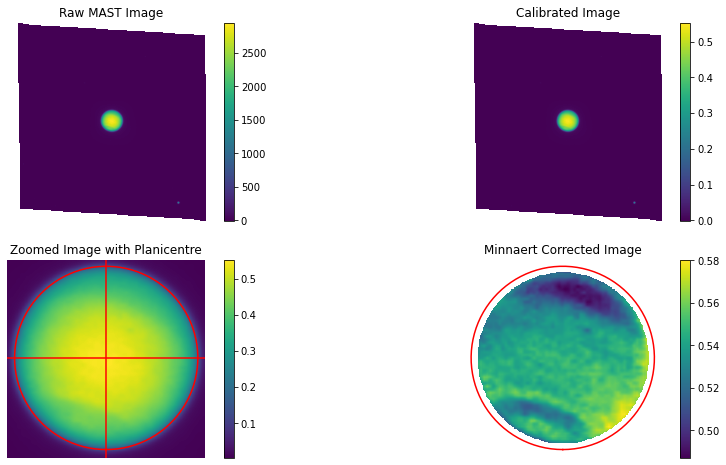

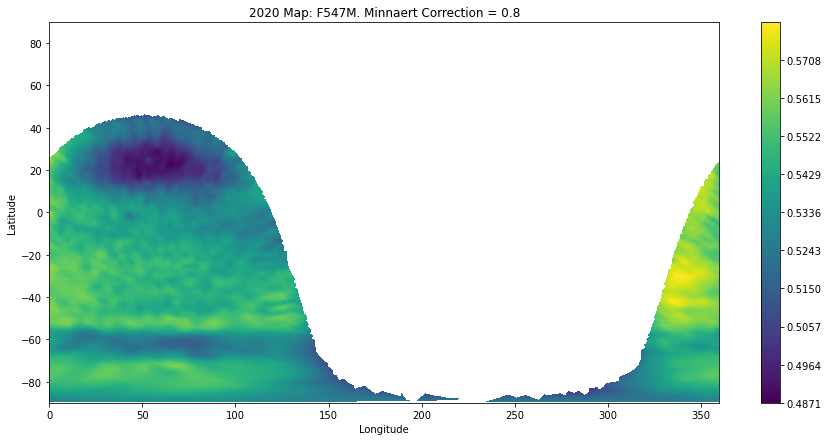

16

In [3]:
mfac = 0.8

img, hdr, scihdr = open_img('data/2020/547/ie0l24peq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1859.82)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2020 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2020/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2020/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


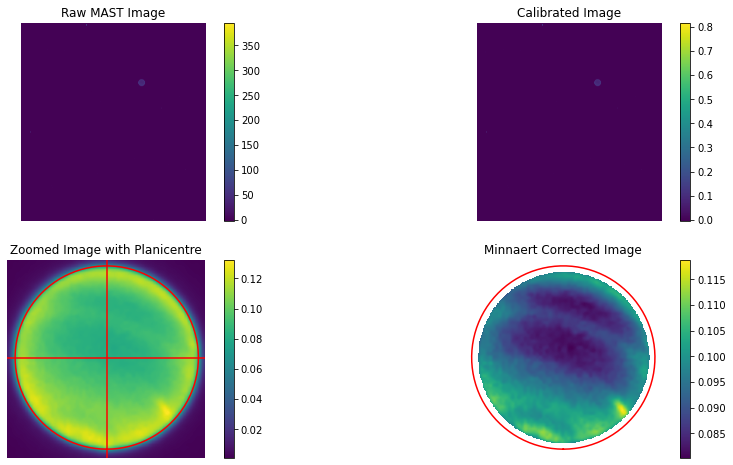

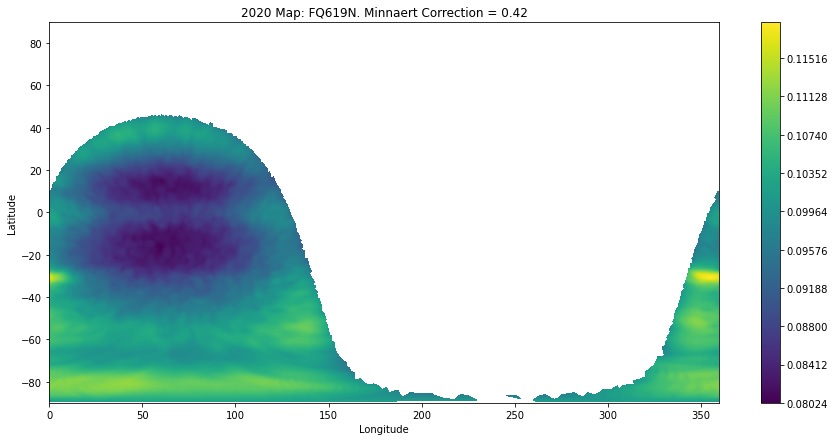

16

In [4]:
mfac = 0.42

img, hdr, scihdr = open_img('data/2020/619/ie0l24poq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1707.85)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad, iterations=2, croppix=1600)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2020 Map: FQ619N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2020/619_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2020/619_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


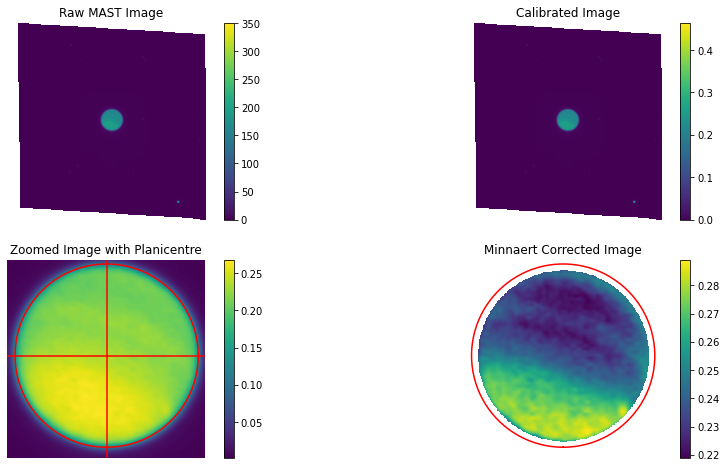

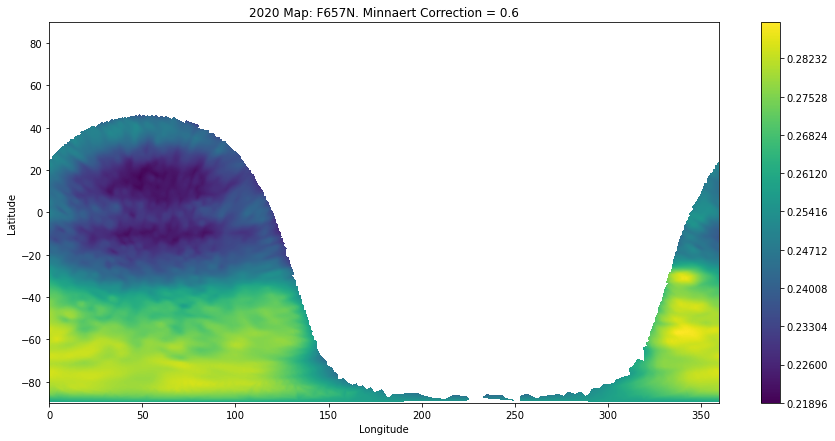

16

In [5]:
mfac = 0.6

img, hdr, scihdr = open_img('data/2020/657/ie0l24pfq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1238.00)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2020 Map: F657N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2020/657_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2020/657_1.fits')

writer657.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


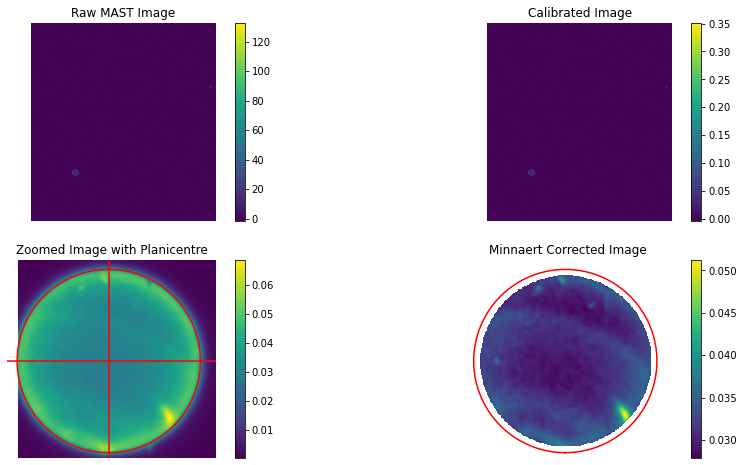

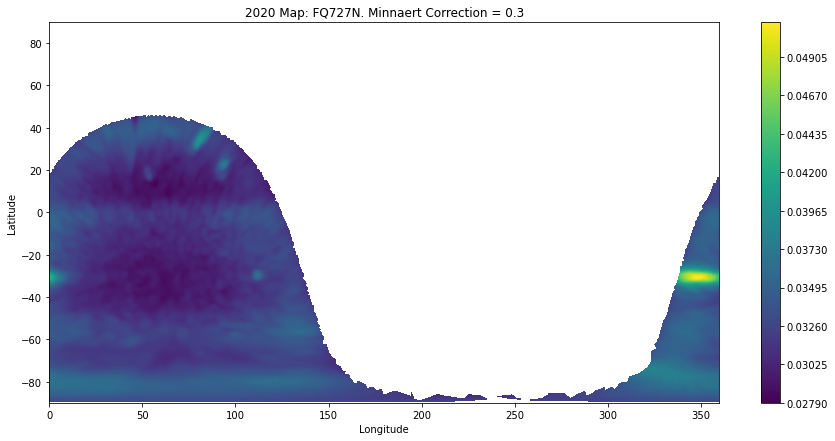

16

In [6]:
mfac = 0.3

img, hdr, scihdr = open_img('data/2020/727/ie0l24pmq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1339.23)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad, iterations=2,croppix=1600)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2020 Map: FQ727N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2020/727_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2020/727_1.fits')

writer727.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


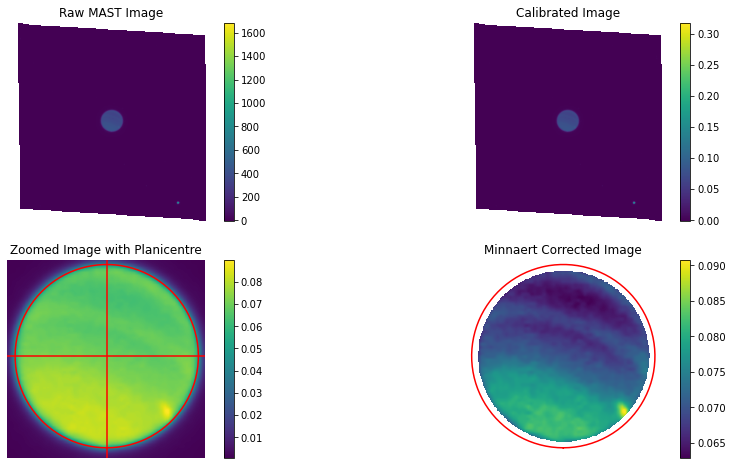

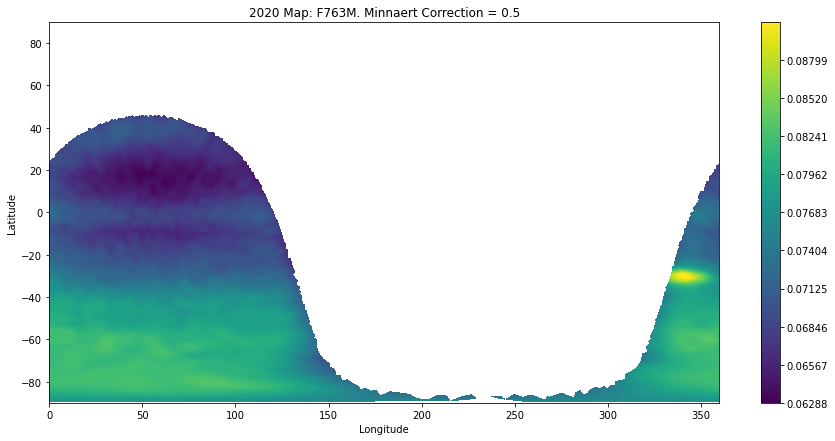

16

In [7]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2020/763/ie0l24pgq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1541.91)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2020 Map: F763M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2020/763_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2020/763_1.fits')

writer763.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


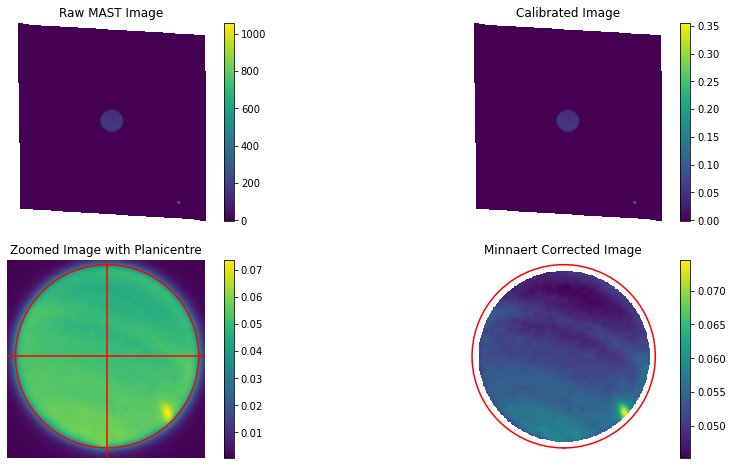

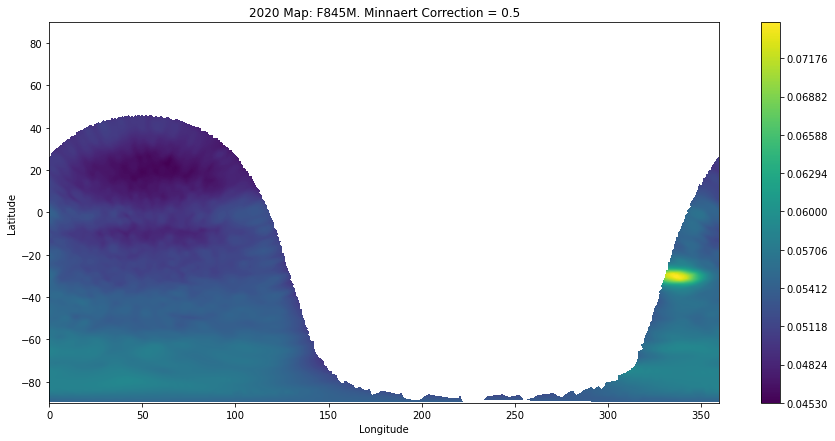

15

In [8]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2020/845/ie0l24pcq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1023.65)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2020 Map: F845M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2020/845_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2020/845_1.fits')

writer845.writerow([float(hdr['EXPSTART'])])

# Year 2019
OPAL YEAR: ALL FILTERS AVAILABLE, using imageset of rotation

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


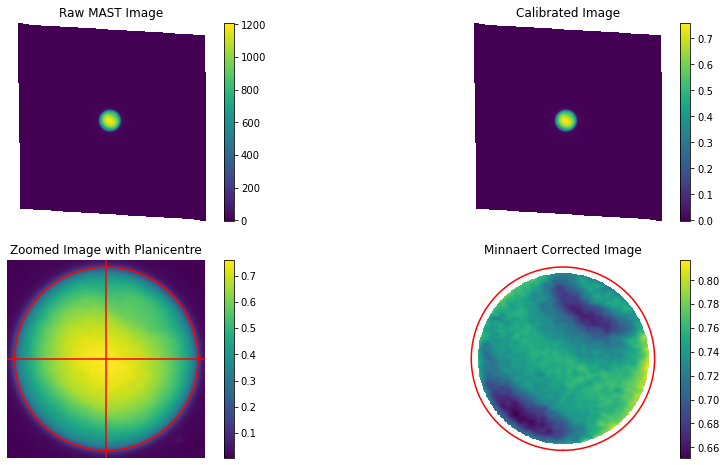

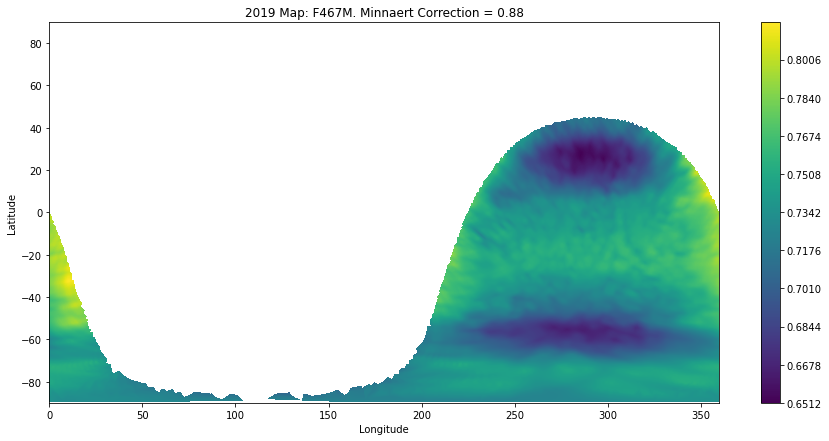

16

In [9]:
mfac = 0.88

img, hdr, scihdr = open_img('data/2019/467/iduy25mnq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 2019.04)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2019 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2019/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2019/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


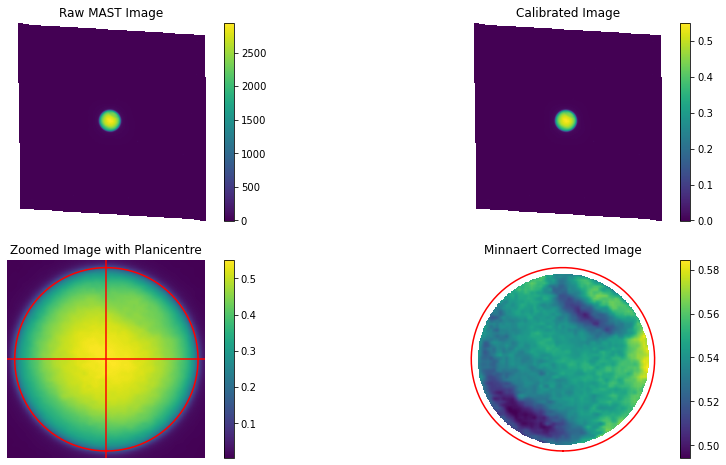

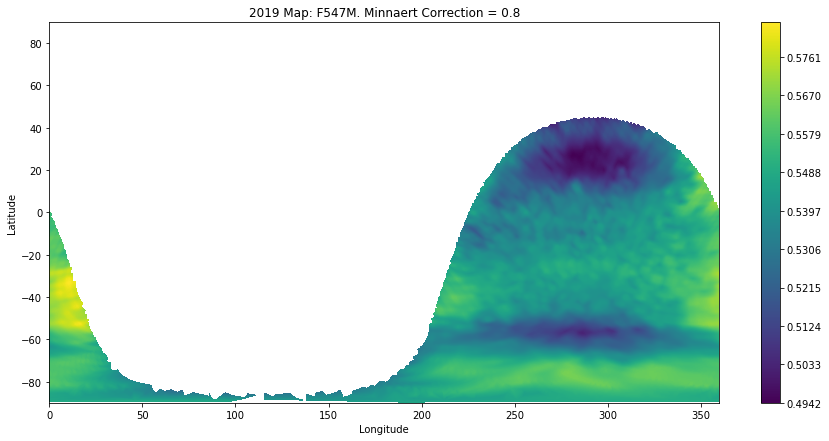

16

In [10]:
mfac = 0.8

img, hdr, scihdr = open_img('data/2019/547/iduy25moq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1859.82)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2019 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2019/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2019/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


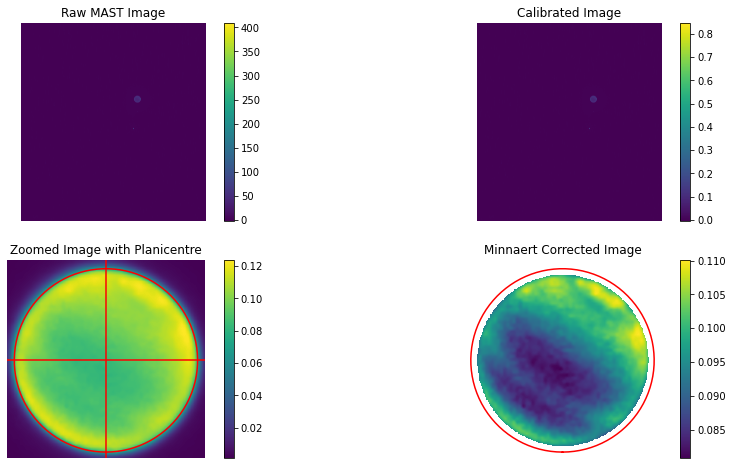

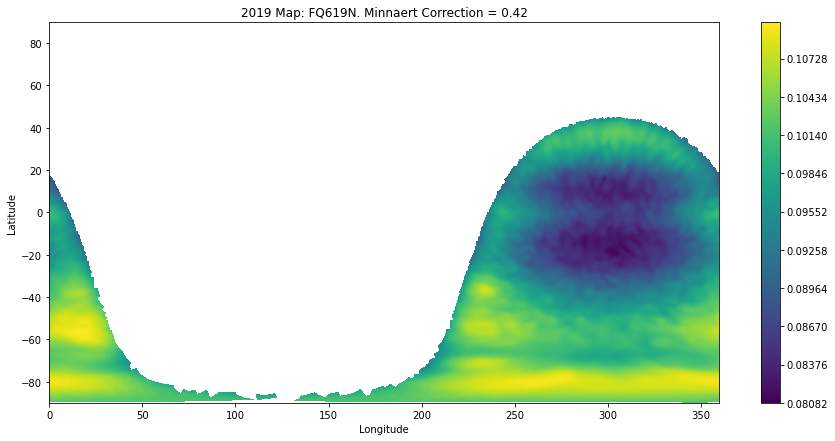

16

In [11]:
mfac = 0.42

img, hdr, scihdr = open_img('data/2019/619/iduy25myq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1707.85)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad, iterations=2, croppix=1600)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2019 Map: FQ619N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2019/619_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2019/619_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


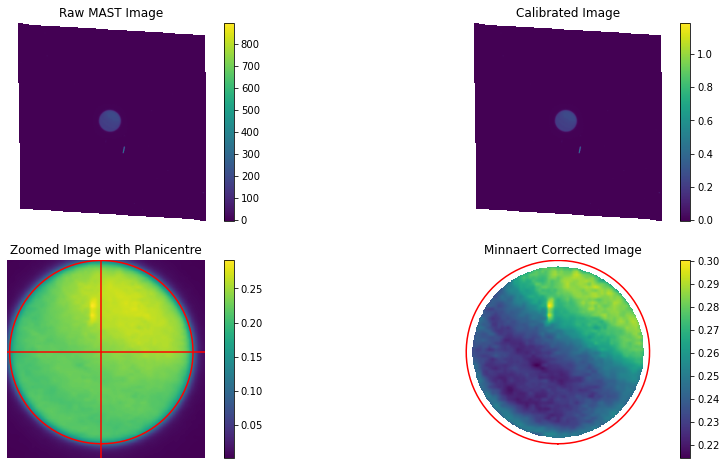

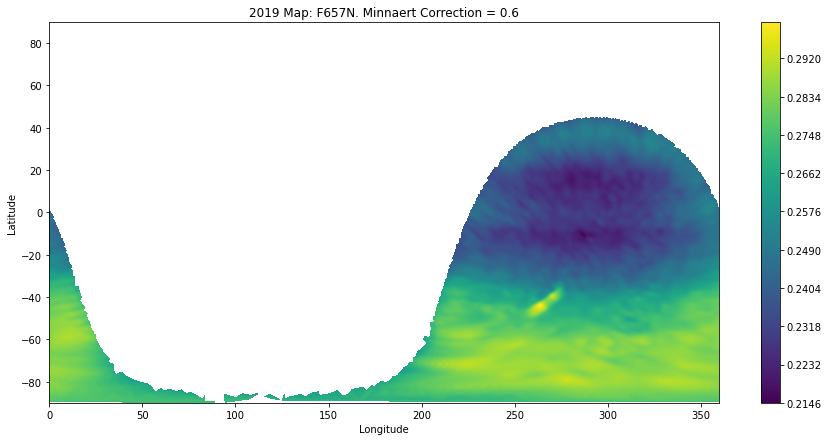

16

In [12]:
mfac = 0.6

img, hdr, scihdr = open_img('data/2019/657/iduy25mpq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1238.00)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2019 Map: F657N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2019/657_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2019/657_1.fits')

writer657.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


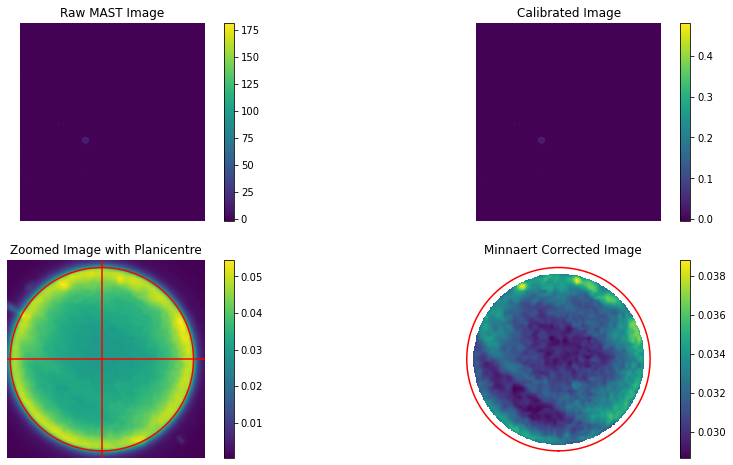

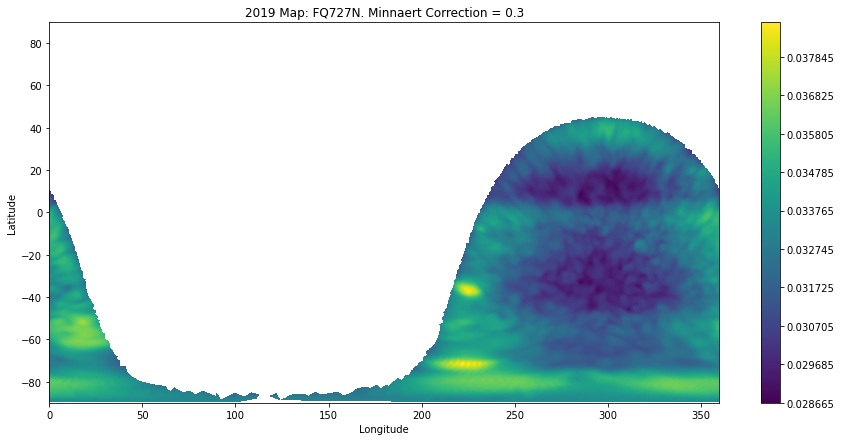

15

In [13]:
mfac = 0.3

img, hdr, scihdr = open_img('data/2019/727/iduy25mwq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1339.23)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad, iterations=2,croppix=1600)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2019 Map: FQ727N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2019/727_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2019/727_1.fits')

writer727.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


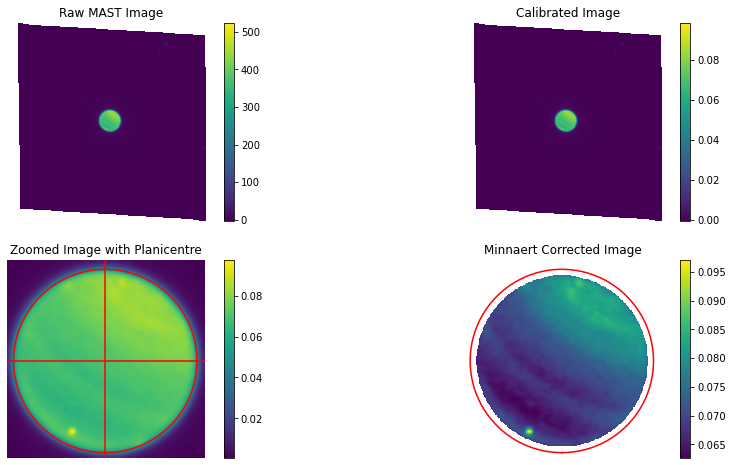

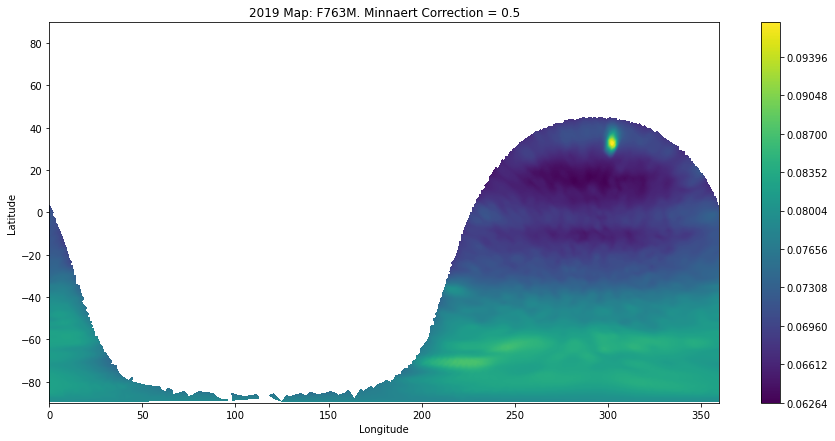

15

In [14]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2019/763/iduy25mqq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1541.91)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2019 Map: F763M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2019/763_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2019/763_1.fits')

writer763.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


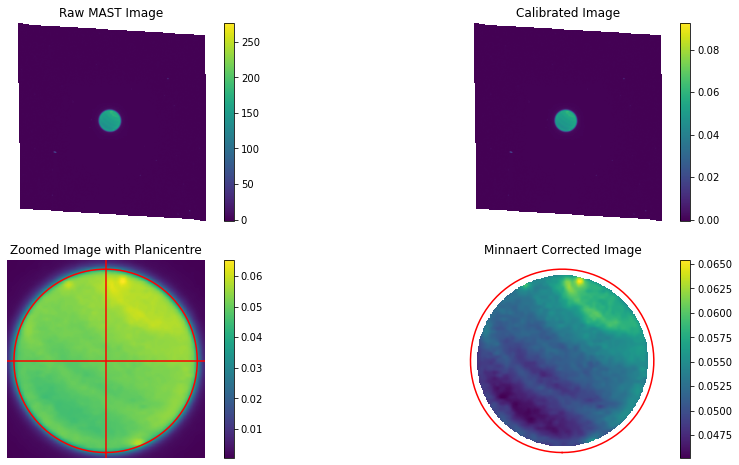

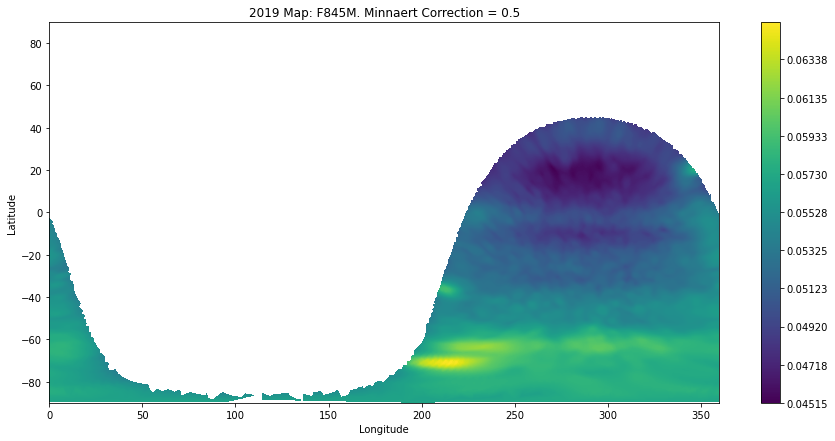

16

In [15]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2019/845/iduy25mmq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1023.65)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2019 Map: F845M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2019/845_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2019/845_1.fits')

writer845.writerow([float(hdr['EXPSTART'])])

# Year 2018
OPAL YEAR: ALL FILTERS AVAILABLE, using imageset of rotation

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.

Locator attempting to generate 1002 ticks ([0.637, ..., 0.8372]), which exceeds Locator.MAXTICKS (1000).


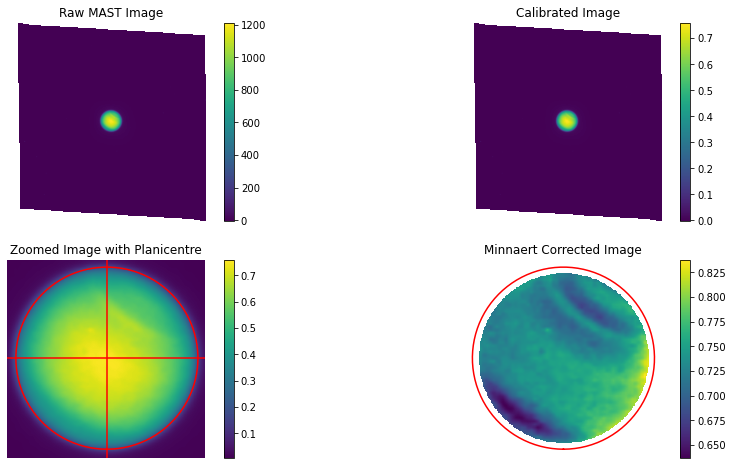

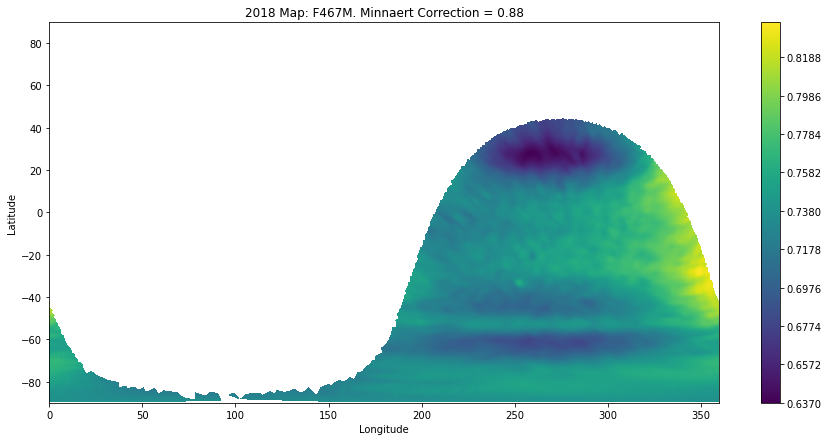

Locator attempting to generate 1002 ticks ([0.637, ..., 0.8372]), which exceeds Locator.MAXTICKS (1000).


16

In [16]:
mfac = 0.88

img, hdr, scihdr = open_img('data/2018/467/idg263cvq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 2019.04)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2018 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2018/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2018/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


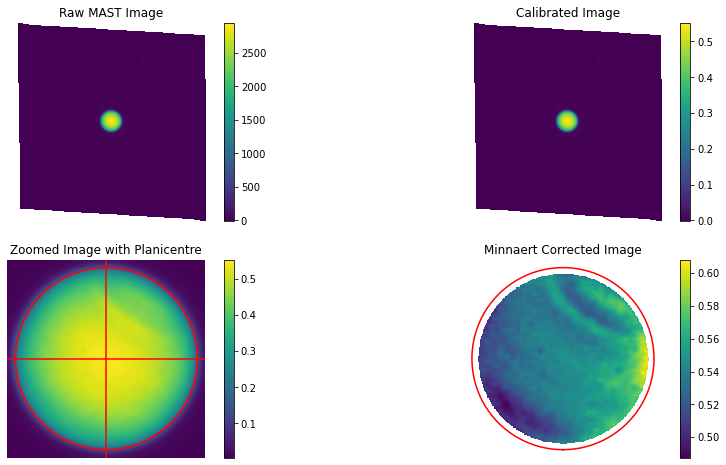

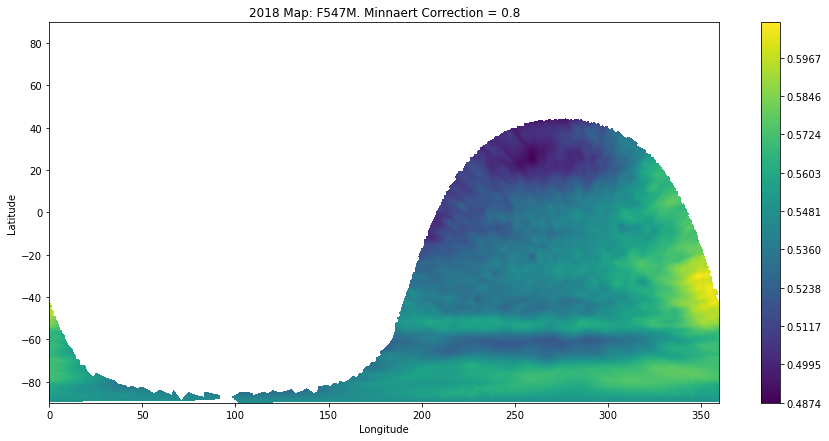

16

In [17]:
mfac = 0.8

img, hdr, scihdr = open_img('data/2018/547/idg263cwq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1859.82)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2018 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2018/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2018/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


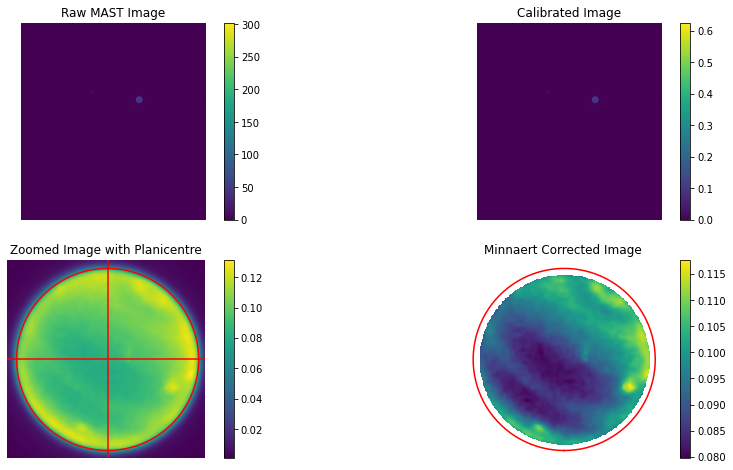

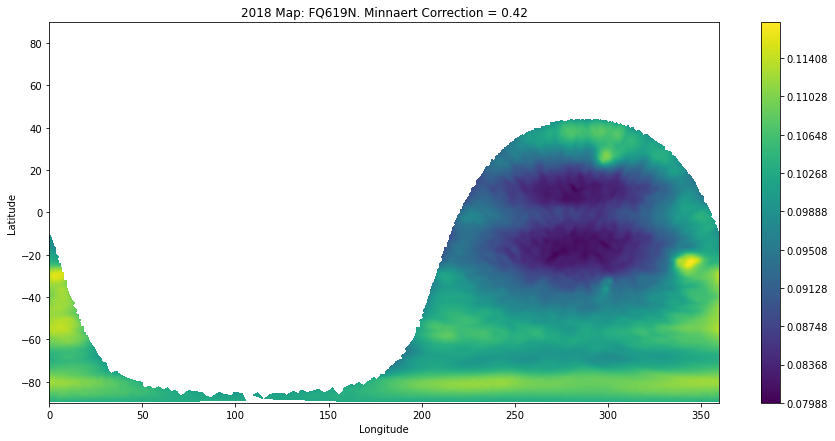

16

In [18]:
mfac = 0.42

img, hdr, scihdr = open_img('data/2018/619/idg263dbq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1707.85)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2018 Map: FQ619N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2018/619_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2018/619_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


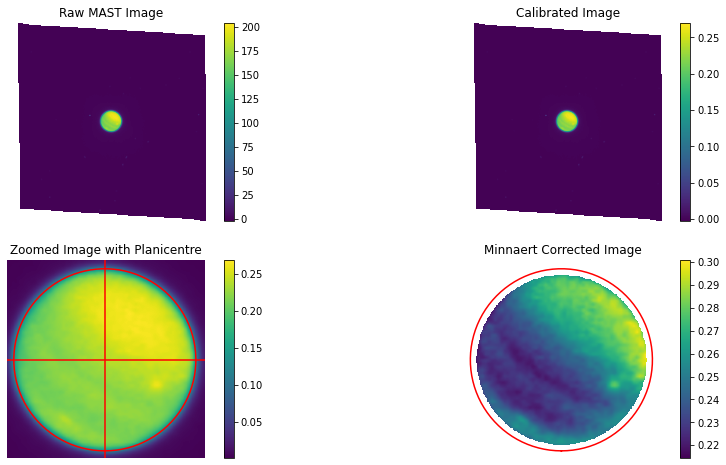

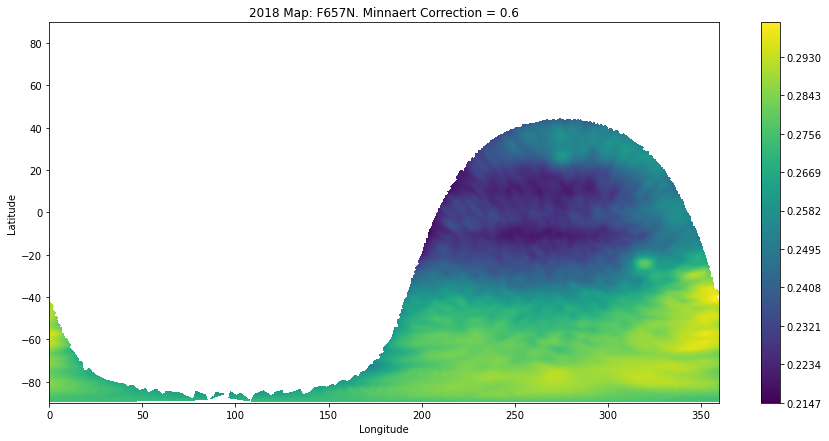

16

In [19]:
mfac = 0.6

img, hdr, scihdr = open_img('data/2018/657/idg263cxq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1238.00)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2018 Map: F657N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2018/657_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2018/657_1.fits')

writer657.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


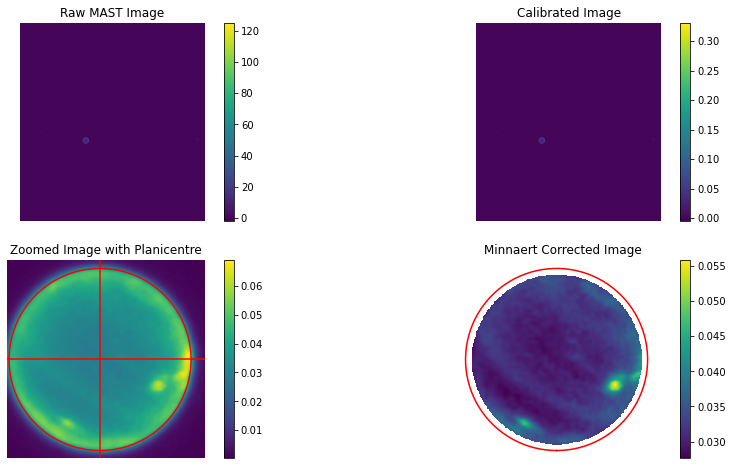

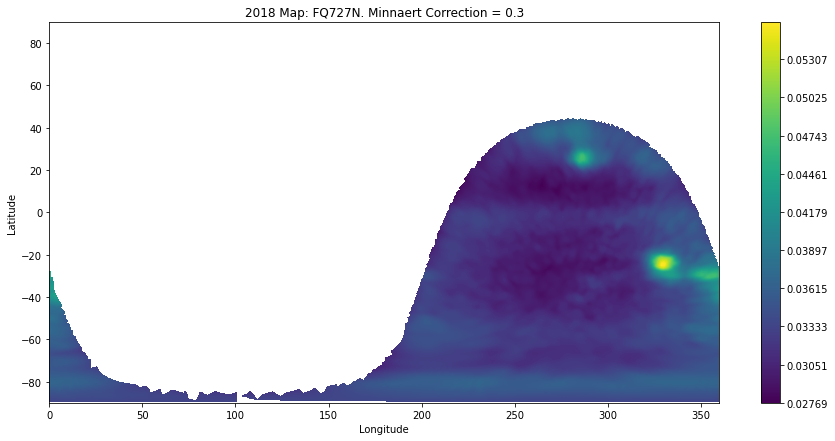

16

In [20]:
mfac = 0.3

img, hdr, scihdr = open_img('data/2018/727/idg263d5q_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1339.23)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad, iterations=2,croppix=1600)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2018 Map: FQ727N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2018/727_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2018/727_1.fits')

writer727.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


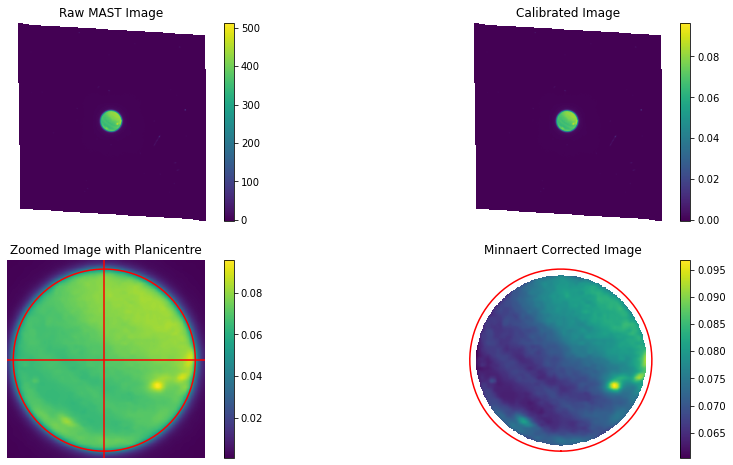

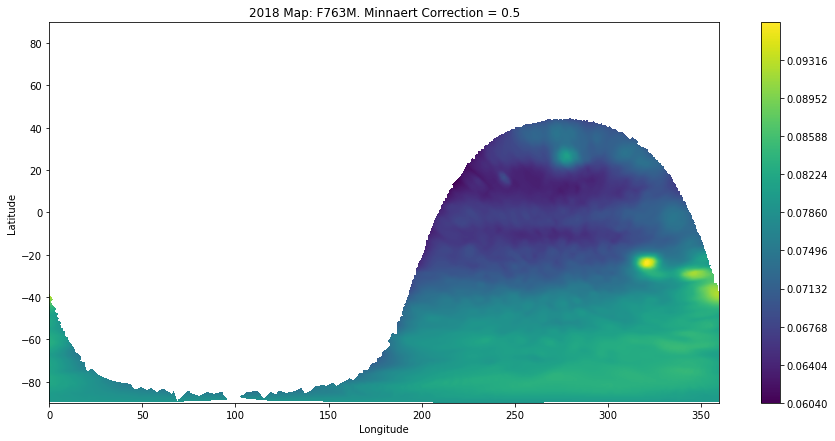

16

In [21]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2018/763/idg263cyq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1541.91)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2018 Map: F763M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2018/763_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2018/763_1.fits')

writer763.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


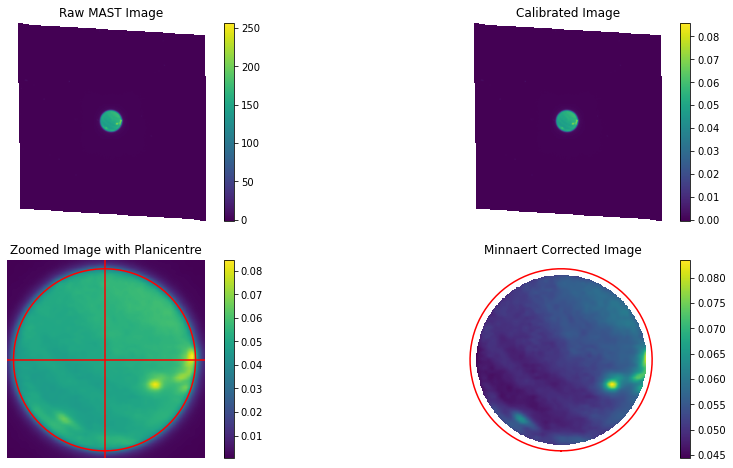

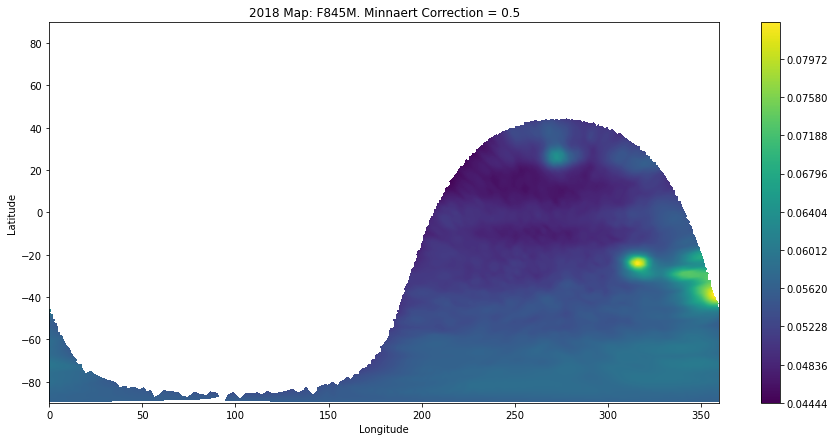

16

In [22]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2018/845/idg263cuq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1023.65)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2018 Map: F845M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2018/845_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2018/845_1.fits')

writer845.writerow([float(hdr['EXPSTART'])])

# Year 2017
OPAL YEAR: ALL FILTERS AVAILABLE, using imageset 22 of rotation 1

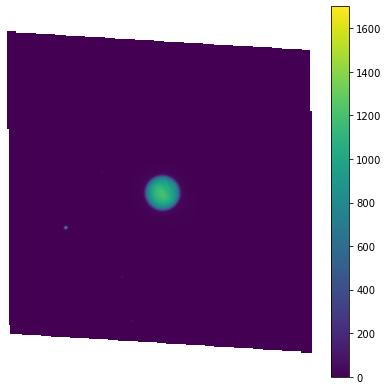

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))


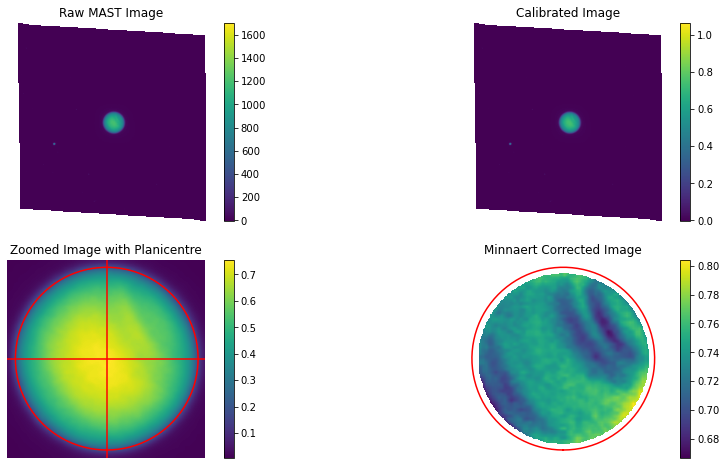

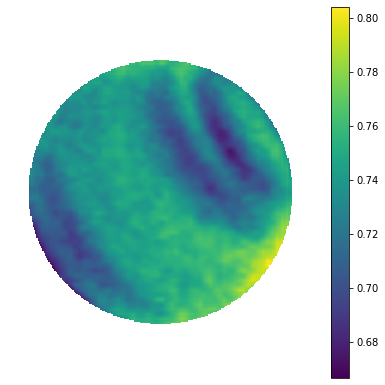

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


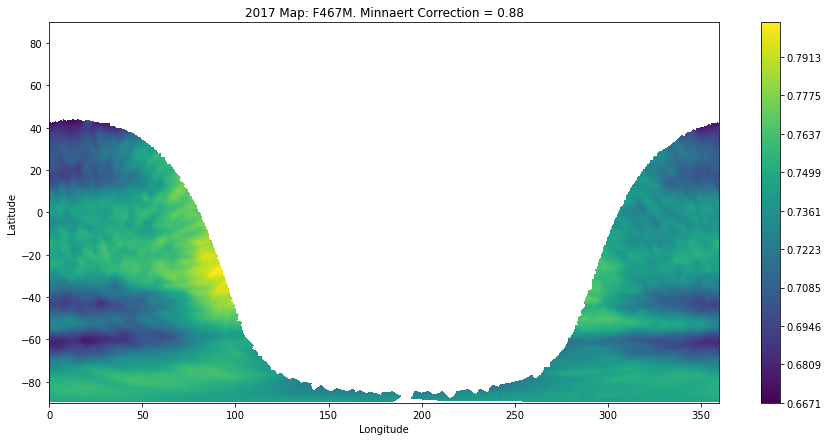

16

In [23]:
mfac = 0.88

img, hdr, scihdr = open_img('data/2017/467/id9922buq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 2019.04)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,15))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
#plt.title('MAST Image', fontsize=28)
plt.colorbar(im)
ax1.axis('off')
plt.show()

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')
plt.show()


plt.figure(figsize=(15,15))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
#plt.title('MAST Image', fontsize=28)
plt.colorbar(im)
ax1.axis('off')
plt.show()
ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2017 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2017/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2017/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


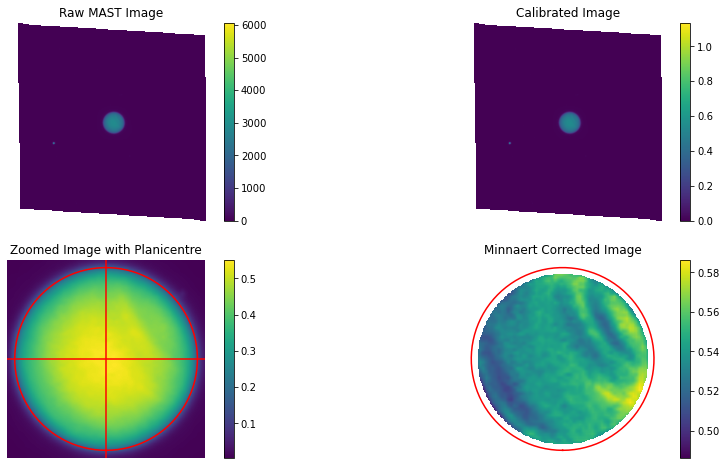

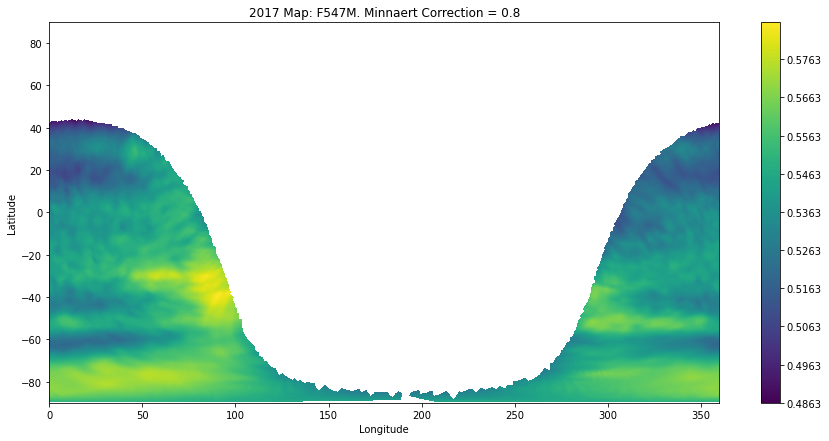

16

In [24]:
mfac = 0.8

img, hdr, scihdr = open_img('data/2017/547/id9922bvq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1859.82)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2017 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2017/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2017/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


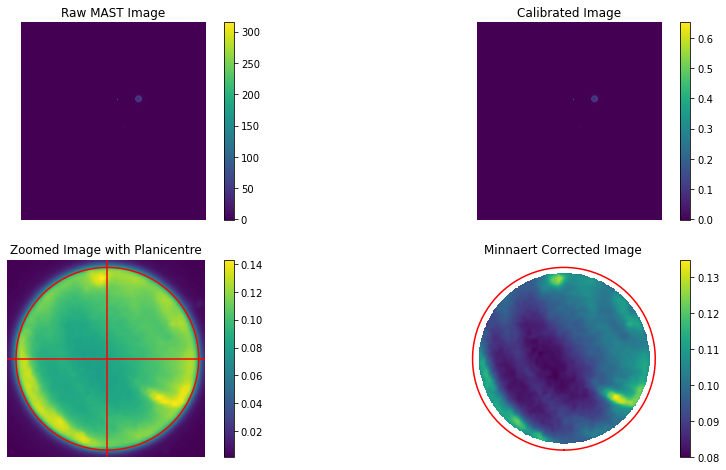

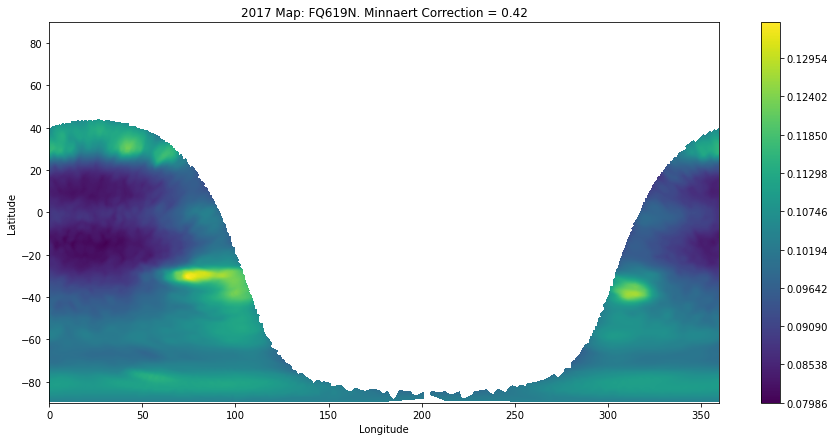

16

In [25]:
mfac = 0.42

img, hdr, scihdr = open_img('data/2017/619/id9922c9q_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1707.85)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2017 Map: FQ619N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2017/619_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2017/619_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


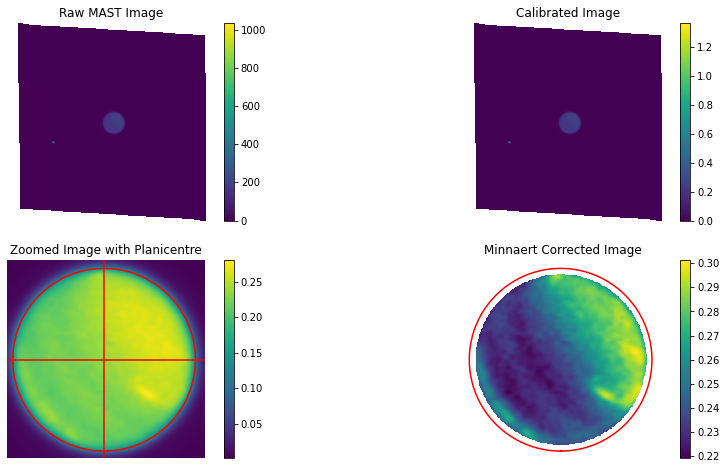

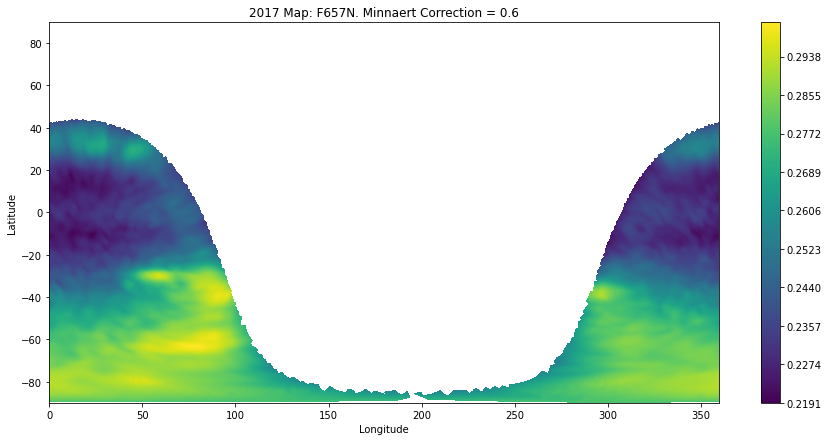

16

In [26]:
mfac = 0.6

img, hdr, scihdr = open_img('data/2017/657/id9922bwq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1238.00)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2017 Map: F657N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2017/657_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2017/657_1.fits')

writer657.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


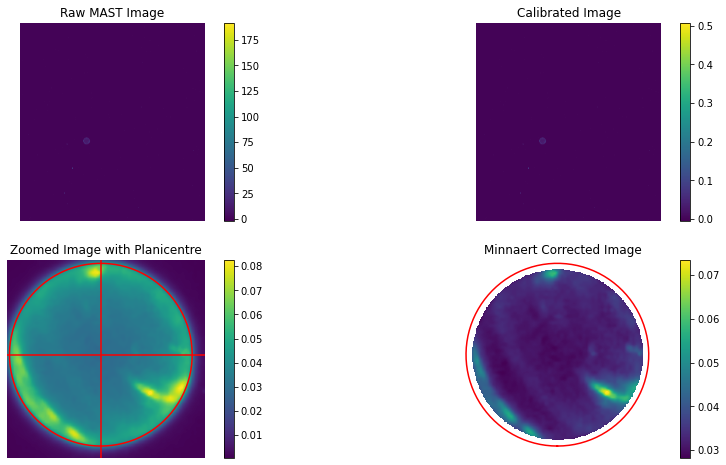

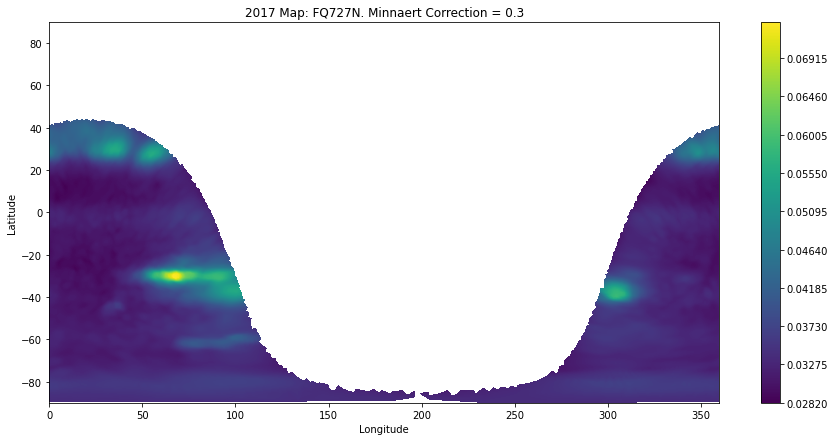

16

In [27]:
mfac = 0.3

img, hdr, scihdr = open_img('data/2017/727/id9922c4q_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1339.23)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad, iterations=2,croppix=1600)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2017 Map: FQ727N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2017/727_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2017/727_1.fits')

writer727.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


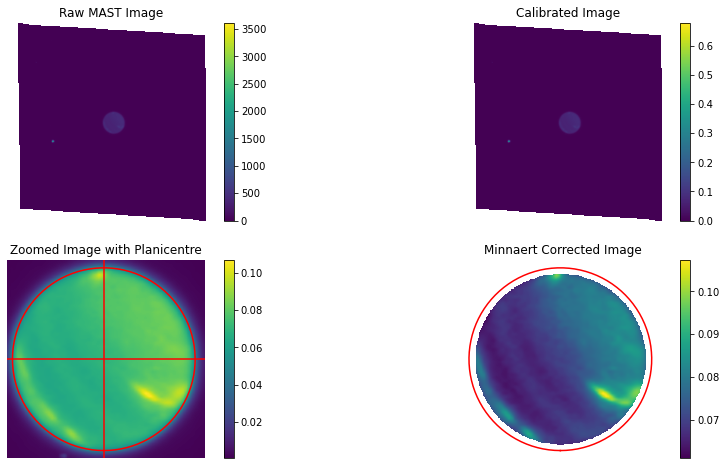

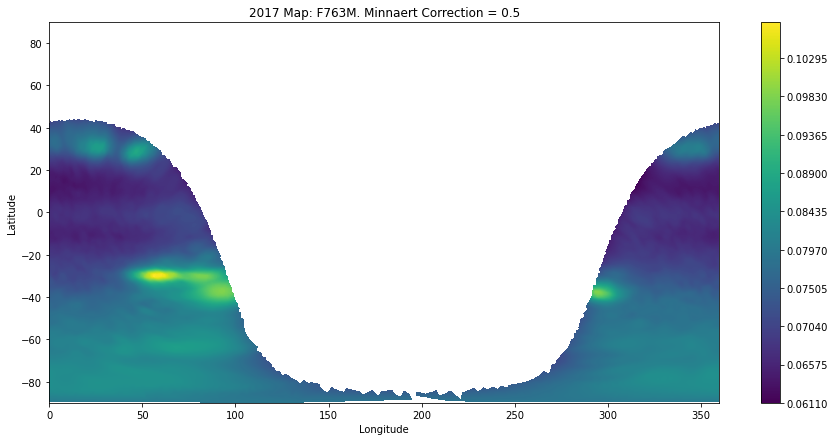

16

In [28]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2017/763/id9922bxq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1541.91)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2017 Map: F763M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2017/763_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2017/763_1.fits')

writer763.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


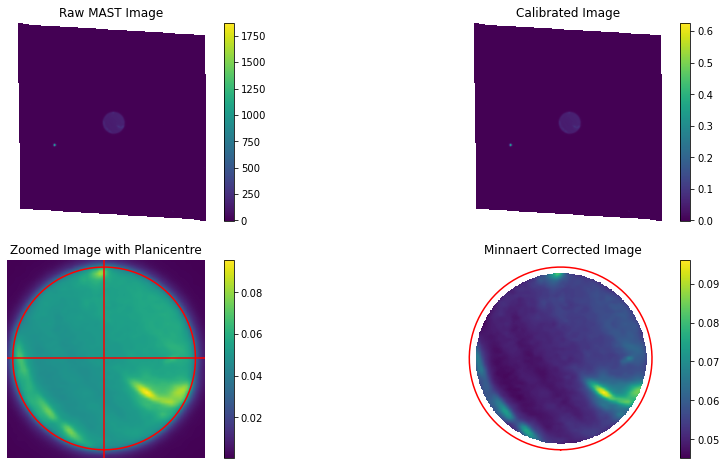

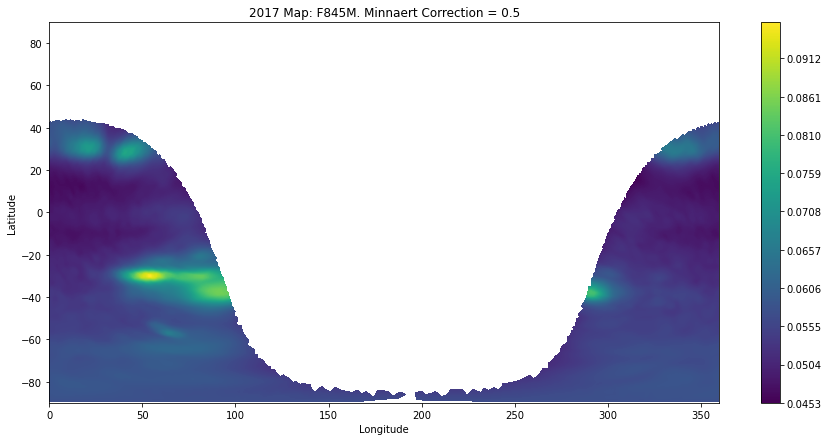

16

In [29]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2017/845/id9922btq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1023.65)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2017 Map: F845M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2017/845_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2017/845_1.fits')

writer845.writerow([float(hdr['EXPSTART'])])

# Year 2016
OPAL YEAR: ALL FILTERS AVAILABLE, using imageset 24 of rotation 1

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


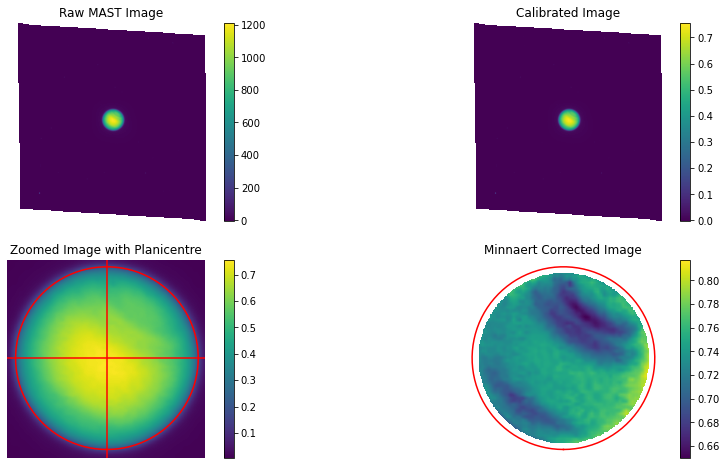

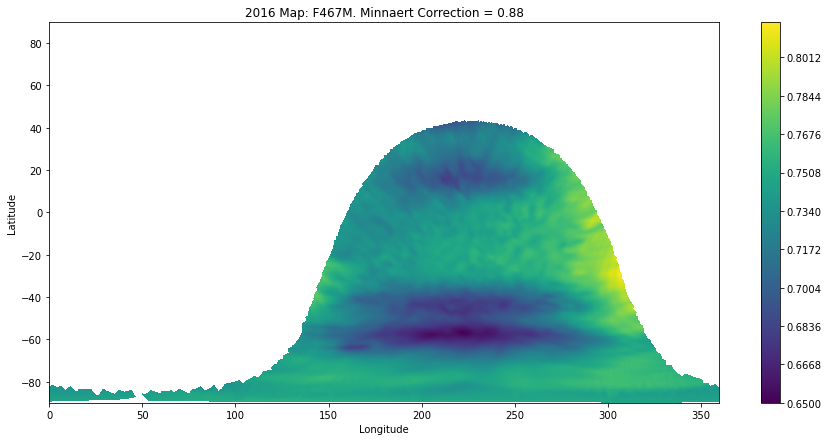

16

In [30]:
mfac = 0.88

img, hdr, scihdr = open_img('data/2016/467/icwy24jbq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 2019.04)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2016 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2016/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2016/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


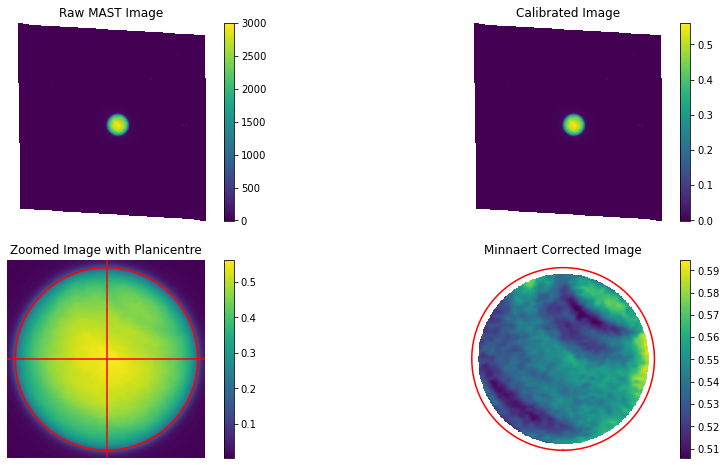

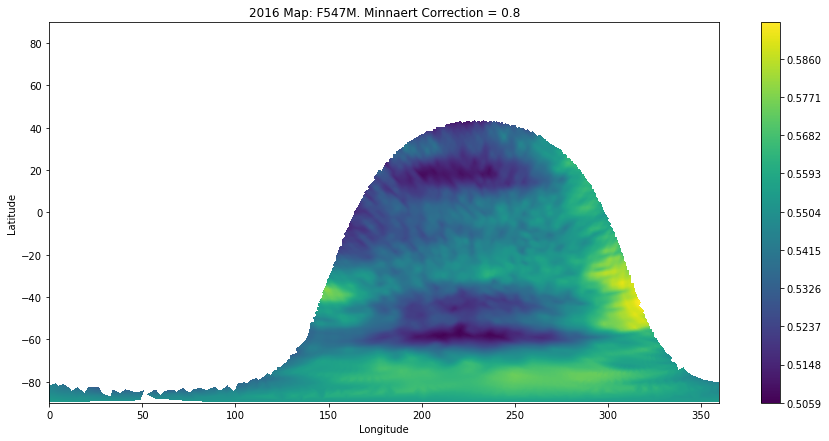

16

In [31]:
mfac = 0.8

img, hdr, scihdr = open_img('data/2016/547/icwy24jhq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1859.82)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2016 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2016/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2016/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


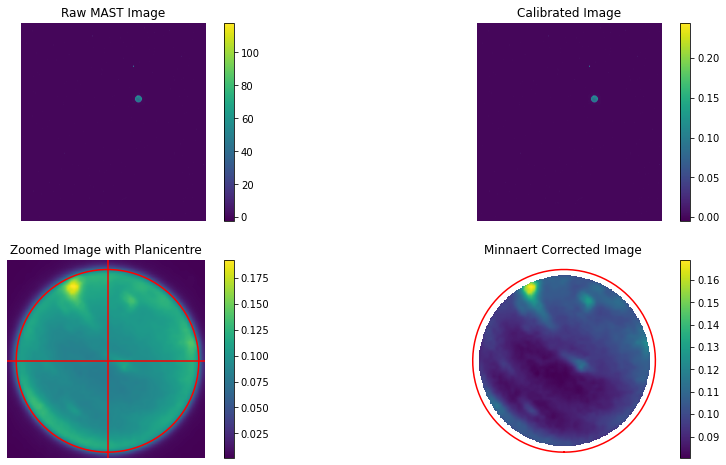

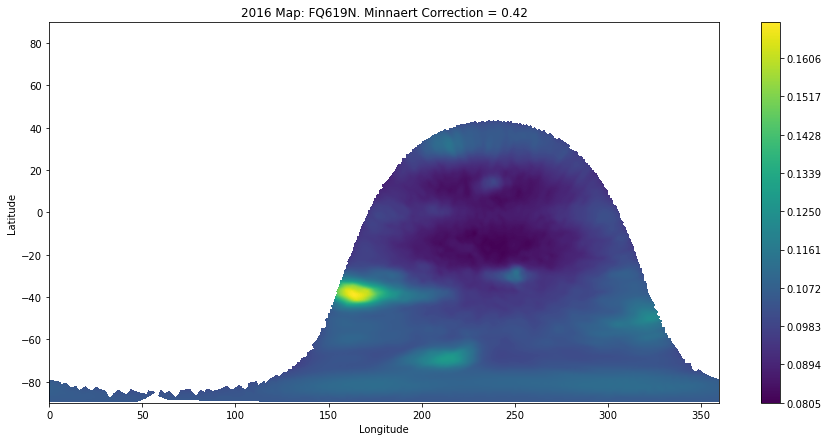

16

In [32]:
mfac = 0.42

img, hdr, scihdr = open_img('data/2016/619/icwy24jyq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1707.85)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2016 Map: FQ619N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2016/619_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2016/619_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


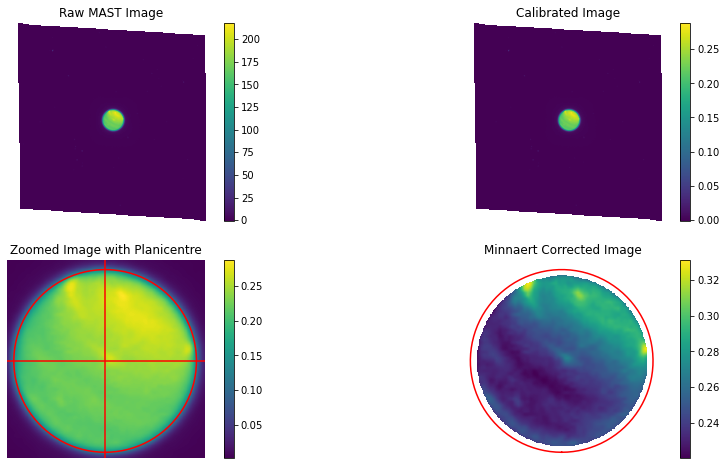

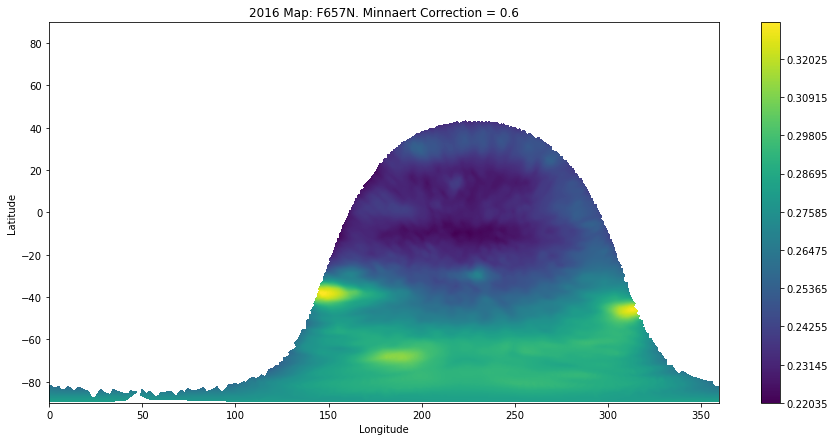

16

In [33]:
mfac = 0.6

img, hdr, scihdr = open_img('data/2016/657/icwy24jdq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1238.00)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2016 Map: F657N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2016/657_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2016/657_1.fits')

writer657.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


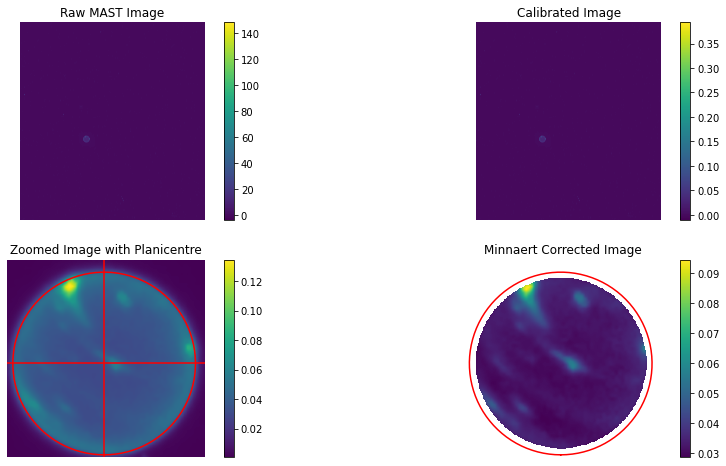

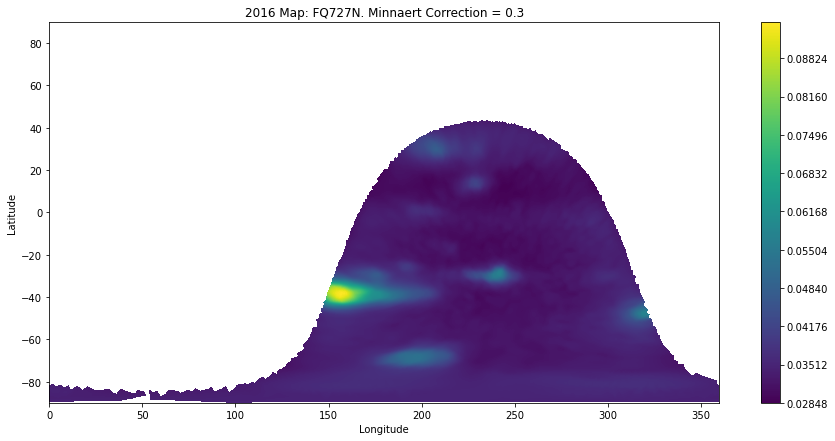

16

In [34]:
mfac = 0.3

img, hdr, scihdr = open_img('data/2016/727/icwy24jlq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1339.23)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad, iterations=2,croppix=1600)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2016 Map: FQ727N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2016/727_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2016/727_1.fits')

writer727.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


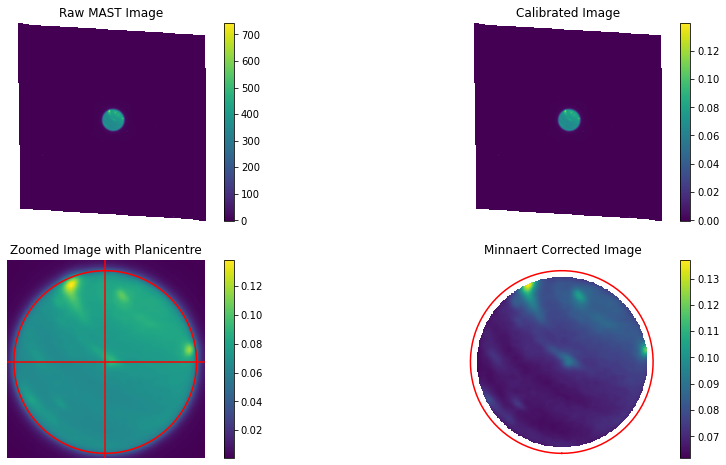

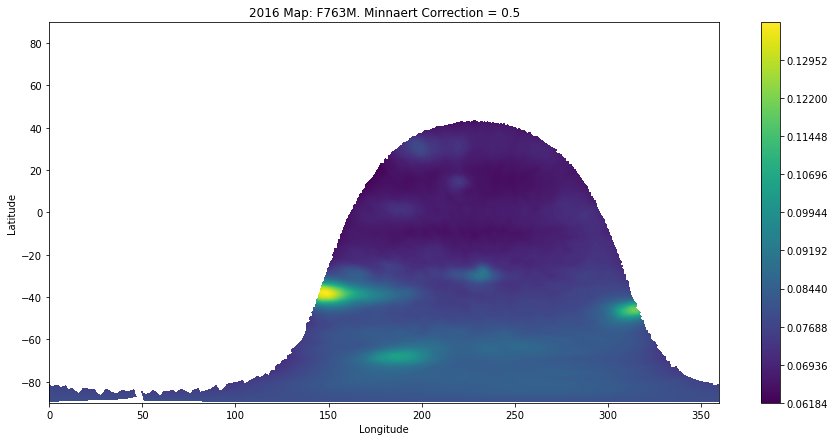

16

In [35]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2016/763/icwy24jeq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1541.91)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2016 Map: F763M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2016/763_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2016/763_1.fits')

writer763.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


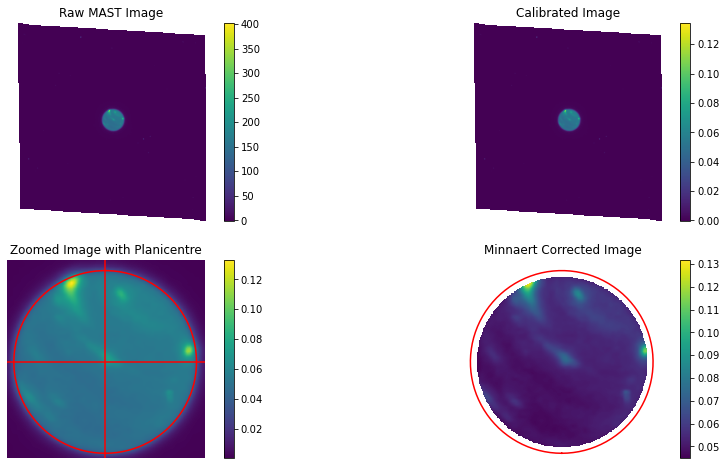

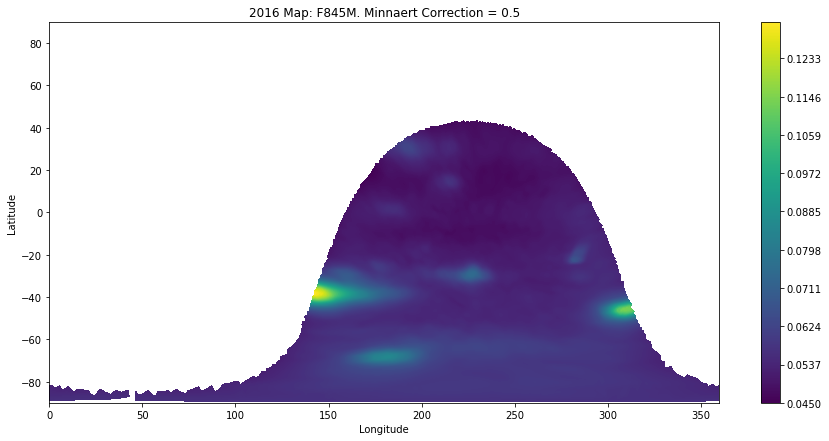

16

In [36]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2016/845/icwy24jaq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1023.65)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2016 Map: F845M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2016/845_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2016/845_1.fits')

writer845.writerow([float(hdr['EXPSTART'])])

# Year 2015
OPAL YEAR (earliest): ALL FILTERS AVAILABLE, using imageset 30 of 1st rotation

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


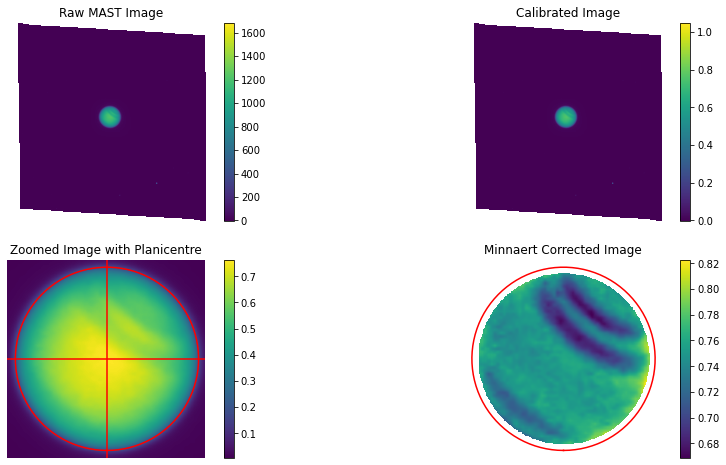

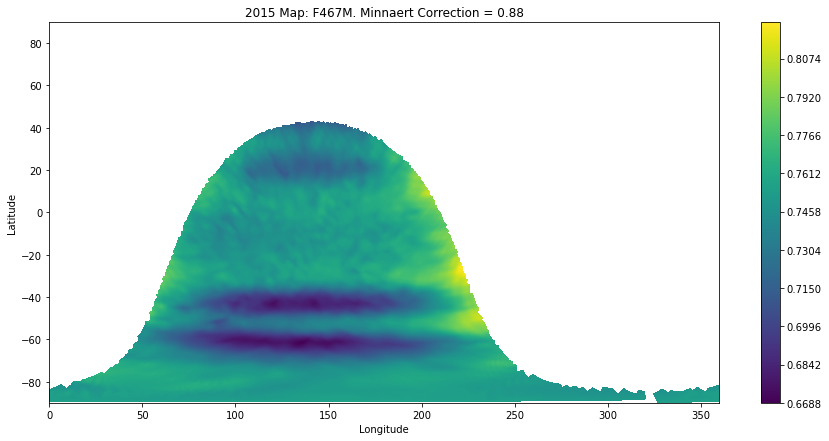

16

In [37]:
mfac = 0.88

img, hdr, scihdr = open_img('data/2015/467/icpf30gqq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 2019.04)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2015 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude', fontsize=28)
plt.xticks(fontsize=28)
plt.ylim([-90,45])
plt.yticks(fontsize=28)
plt.ylabel('Latitude', fontsize=28)
plt.savefig('maps/2015/467_1.png', bbox_inches = 'tight', facecolor = 'white')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2015/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


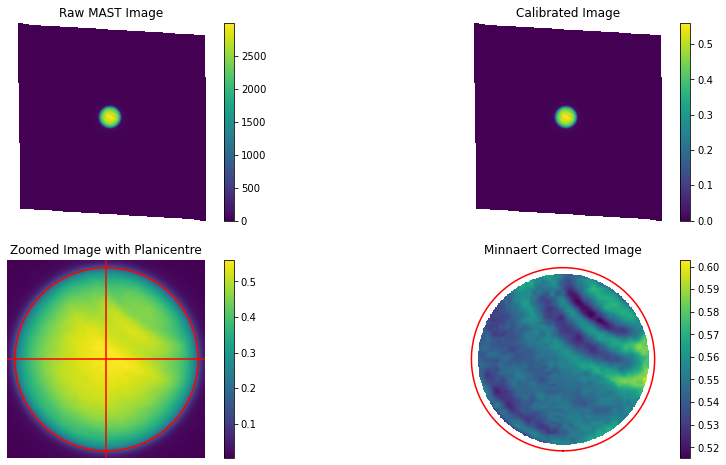

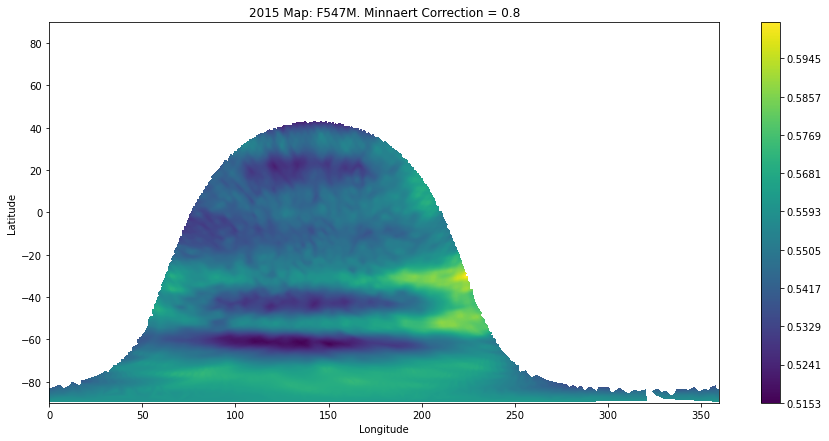

15

In [38]:
mfac = 0.8

img, hdr, scihdr = open_img('data/2015/547/icpf30grq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1859.82)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2015 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2015/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2015/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


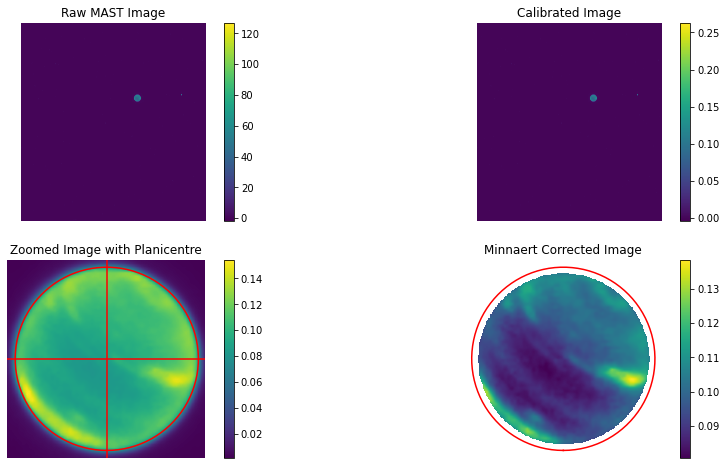

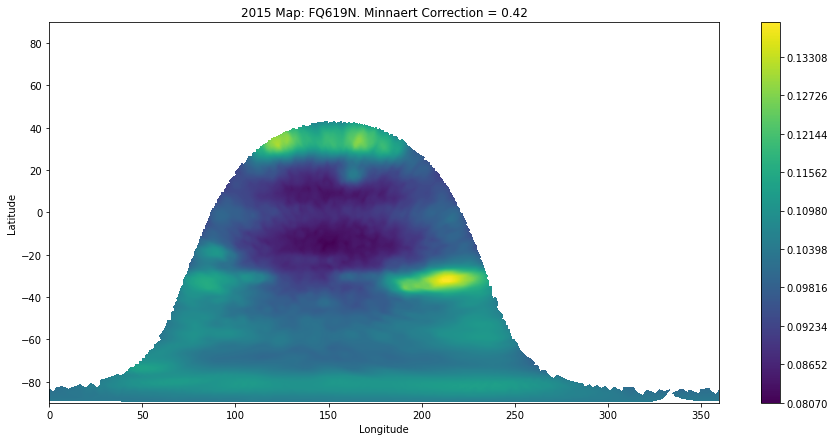

15

In [39]:
mfac = 0.42

img, hdr, scihdr = open_img('data/2015/619/icpf30h1q_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1707.85)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2015 Map: FQ619N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2015/619_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2015/619_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


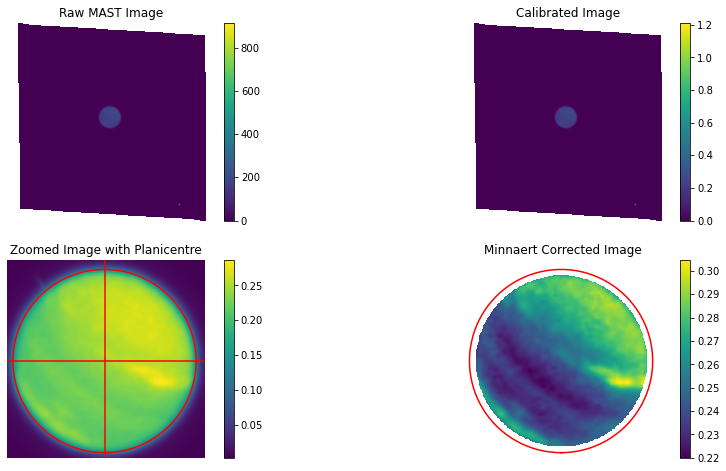

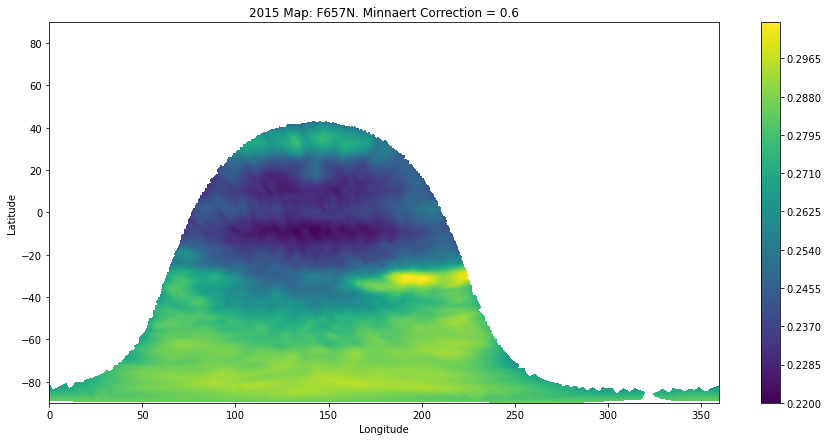

16

In [40]:
mfac = 0.6

img, hdr, scihdr = open_img('data/2015/657/icpf30gsq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1238.00)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2015 Map: F657N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2015/657_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2015/657_1.fits')

writer657.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


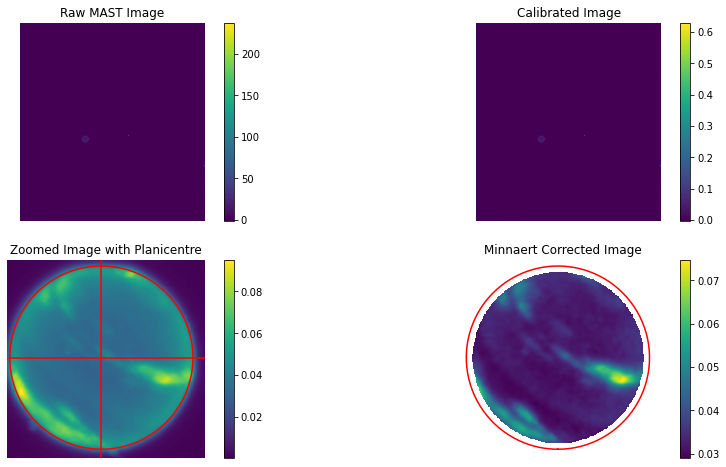

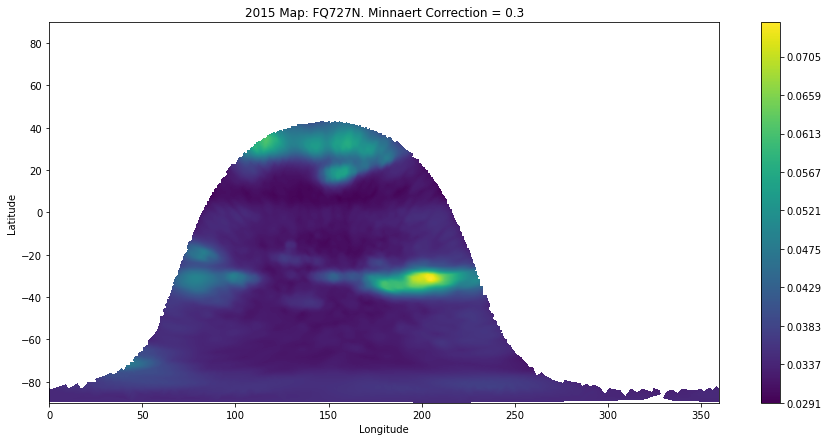

16

In [41]:
mfac = 0.3

img, hdr, scihdr = open_img('data/2015/727/icpf30gzq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1339.23)

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad, iterations=2,croppix=1600)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2015 Map: FQ727N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2015/727_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2015/727_1.fits')

writer727.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


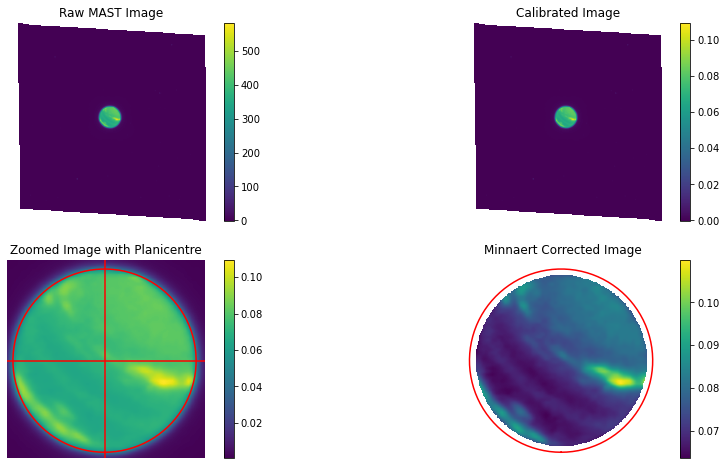

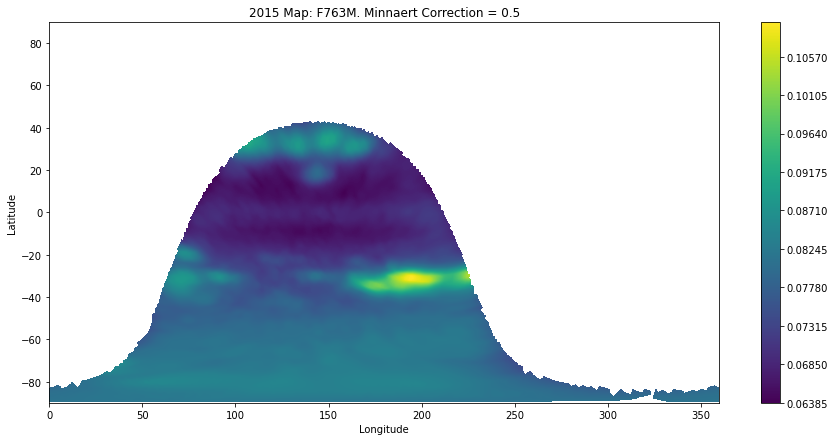

16

In [42]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2015/763/icpf30gtq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1541.91)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2015 Map: F763M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2015/763_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2015/763_1.fits')

writer763.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


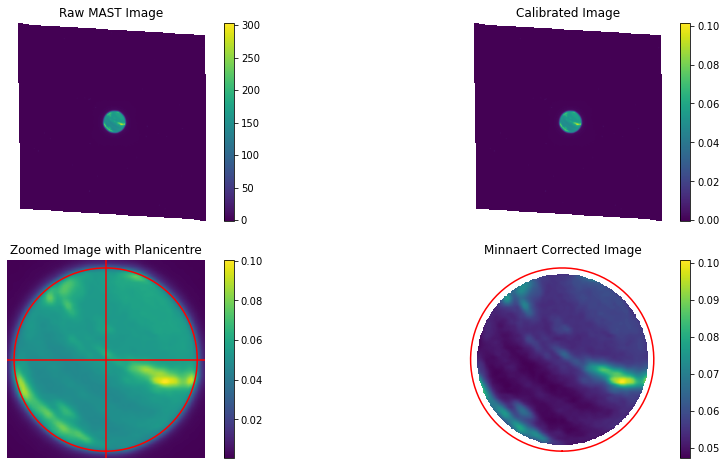

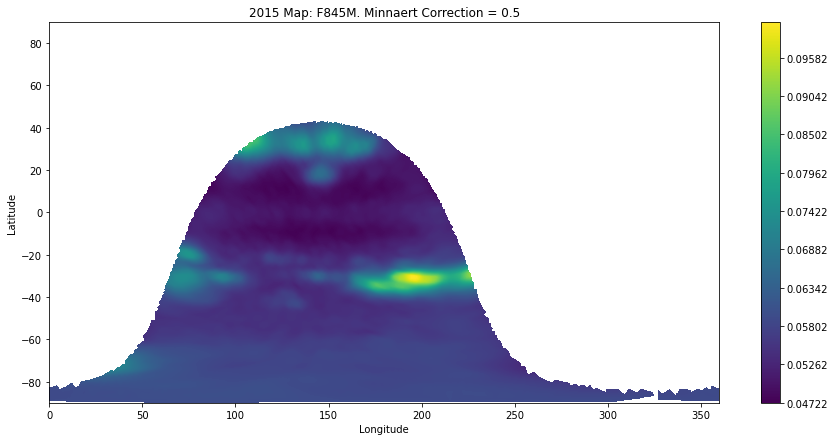

16

In [43]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2015/845/icpf30guq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1023.65)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2015 Map: F845M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2015/845_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2015/845_1.fits')

writer845.writerow([float(hdr['EXPSTART'])])

# Year 2011
Filters available:
- F467M
- F845M

The 2011 data is a single full rotation of Neptune. The 845M images show the clouds very clearly on the disc, and the 3rd image in the rotation appears to be the "clearest" imageset.

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.

Locator attempting to generate 1000 ticks ([0.6674, ..., 0.8672]), which exceeds Locator.MAXTICKS (1000).


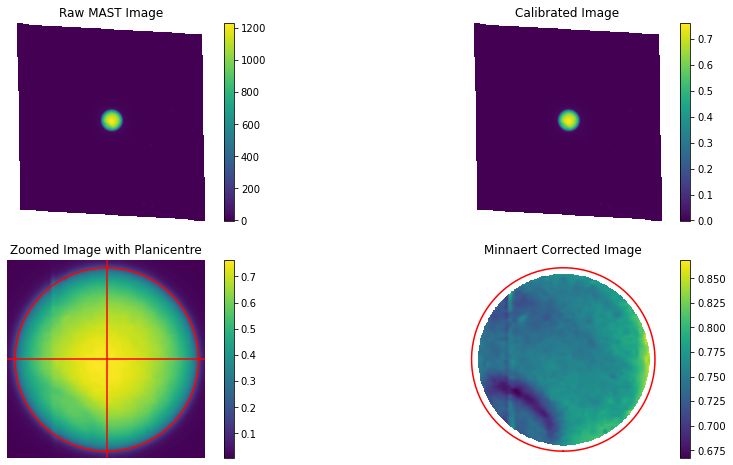

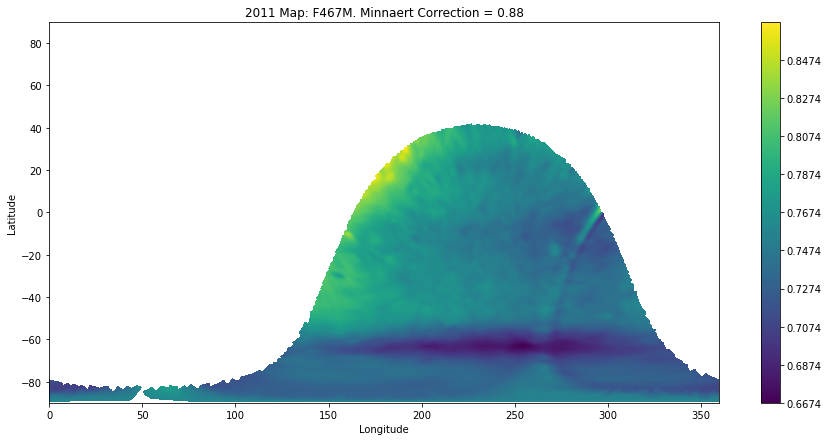

Locator attempting to generate 1000 ticks ([0.6674, ..., 0.8672]), which exceeds Locator.MAXTICKS (1000).


16

In [44]:
mfac = 0.88

img, hdr, scihdr = open_img('data/2011/467/ibol04etq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 2019.04)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2011 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2011/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2011/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


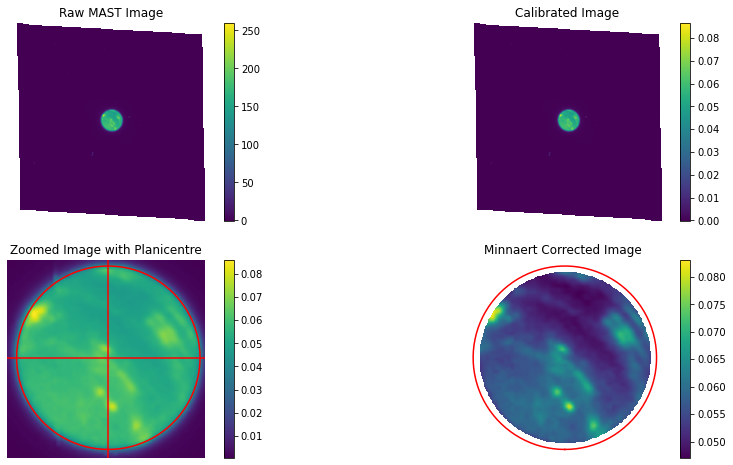

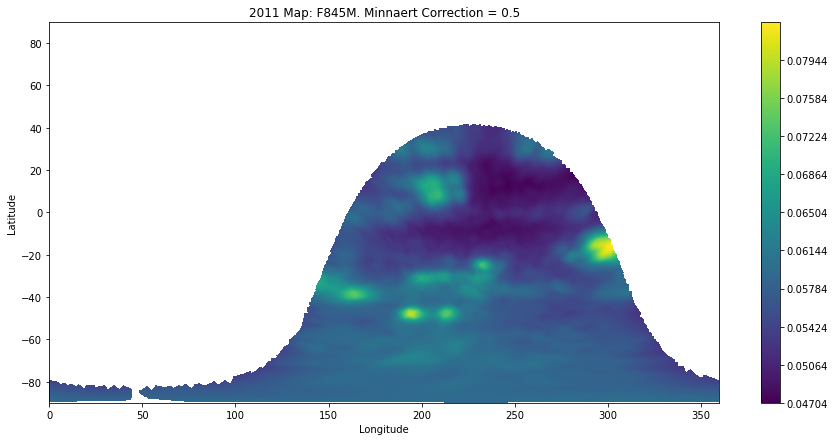

16

In [45]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2011/845/ibol04epq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1023.65)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2011 Map: F845M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2011/845_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2011/845_1.fits')

writer845.writerow([float(hdr['EXPSTART'])])

# Year 2010
Filters available:
- F467M
- F547M
- FQ619N
- FQ727N
- F845M

Only a single snapshot of all bar the 845, taken at a different time of the year (2 months later) than the 845 images, which there were 12. The 845 image chosen was ........ for the reasons: ........ 



C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


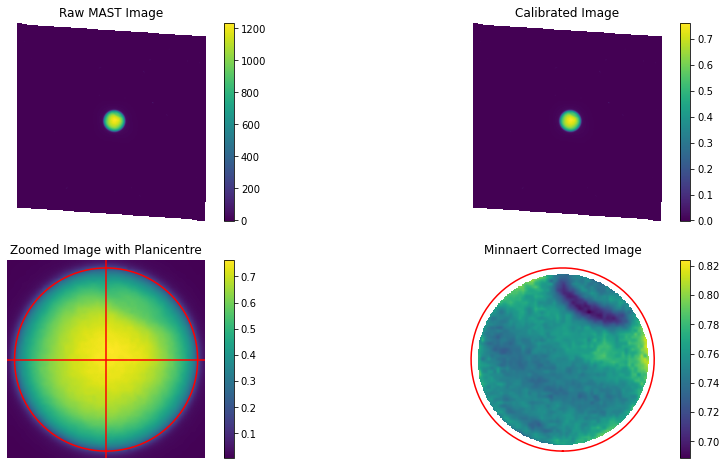

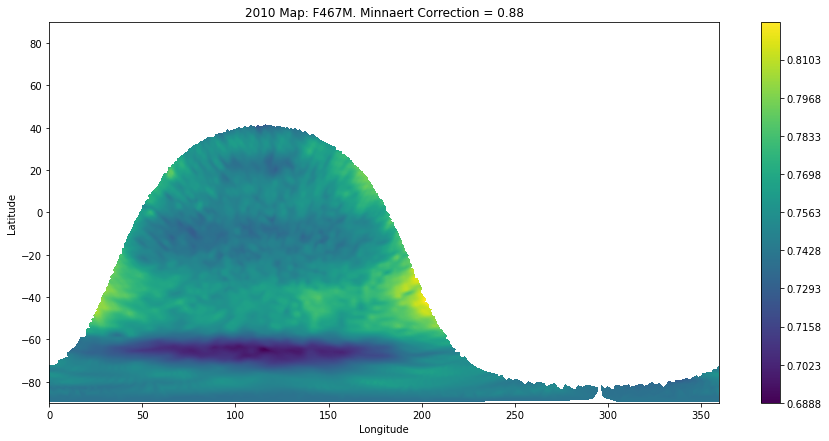

16

In [46]:
mfac = 0.88

img, hdr, scihdr = open_img('data/2010/467/ib2s16xsq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 2019.04)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2010 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2010/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2010/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


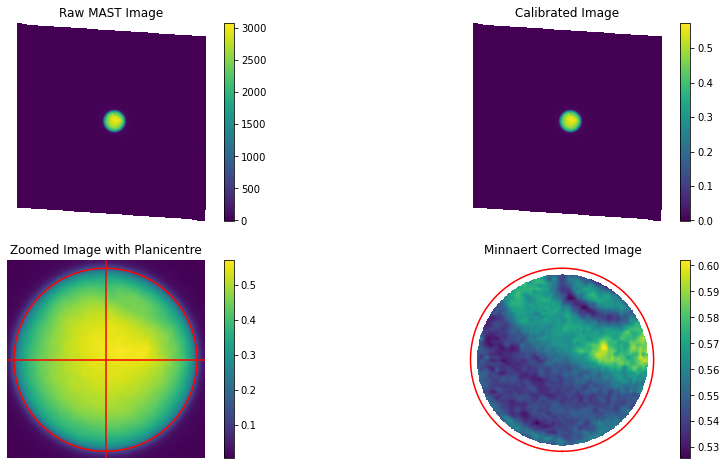

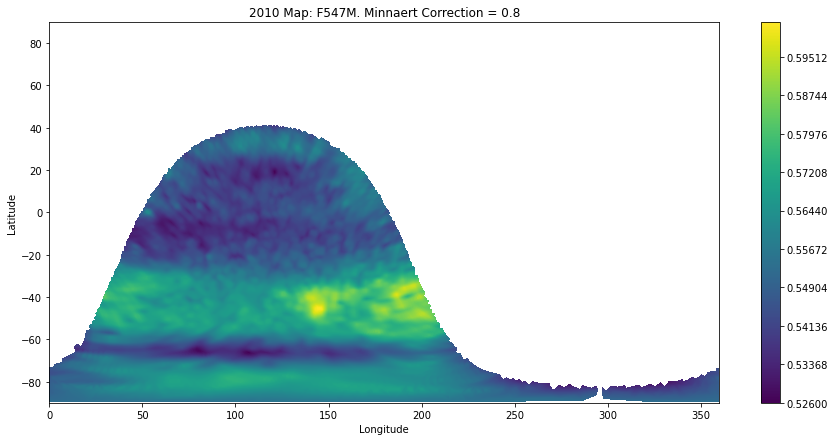

15

In [47]:
mfac = 0.8

img, hdr, scihdr = open_img('data/2010/547/ib2s16xtq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1859.82)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2010 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2010/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2010/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


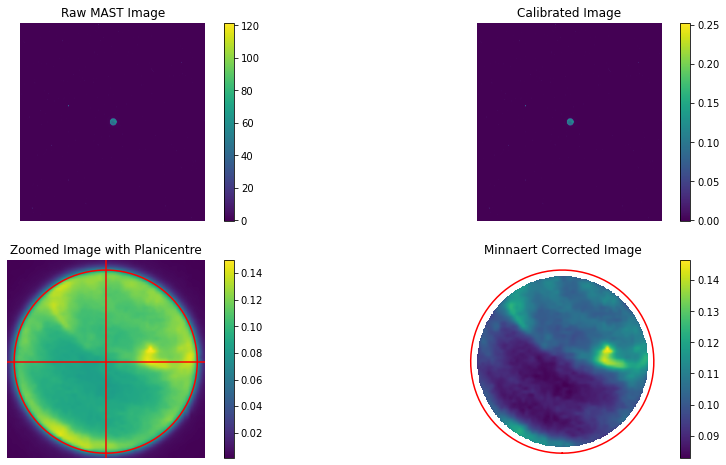

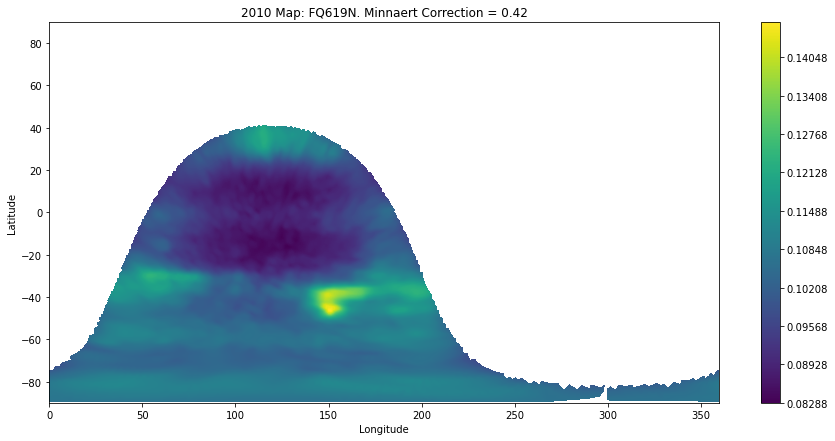

15

In [48]:
mfac = 0.42

img, hdr, scihdr = open_img('data/2010/619/ib2s16xwq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1707.85)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2010 Map: FQ619N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2010/619_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2010/619_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.

Locator attempting to generate 1002 ticks ([0.02875, ..., 0.07880000000000001]), which exceeds Locator.MAXTICKS (1000).


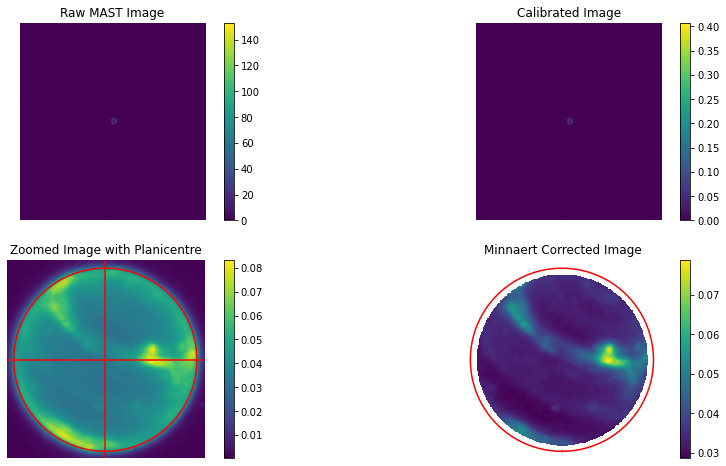

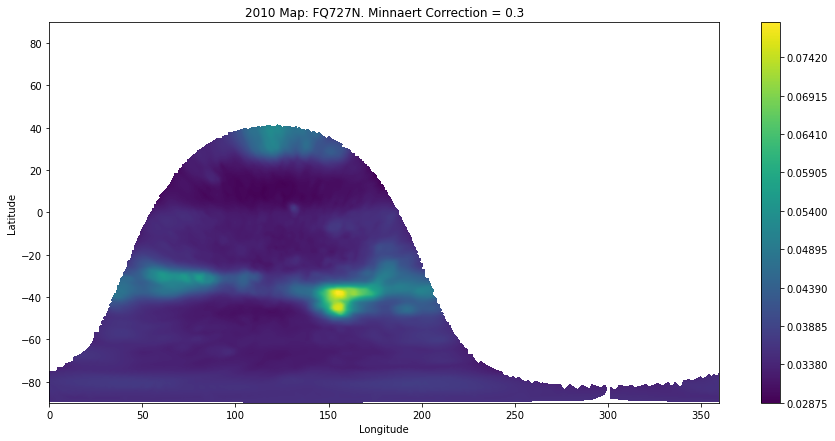

Locator attempting to generate 1002 ticks ([0.02875, ..., 0.07880000000000001]), which exceeds Locator.MAXTICKS (1000).


16

In [49]:
mfac = 0.3

img, hdr, scihdr = open_img('data/2010/727/ib2s16xxq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1339.23)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2010 Map: FQ727N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2010/727_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2010/727_1.fits')

writer727.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


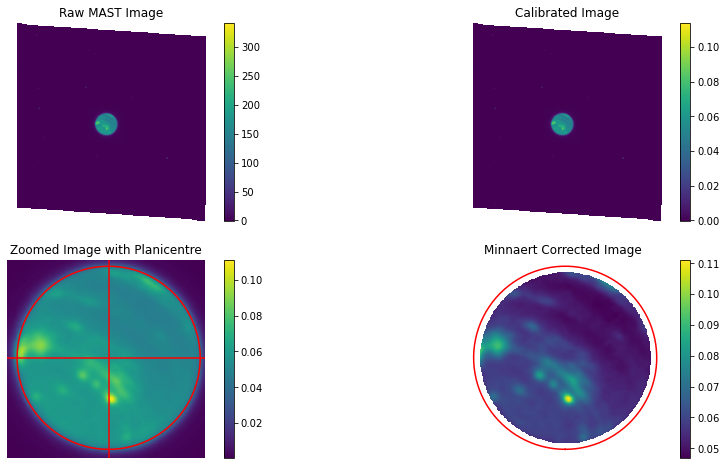

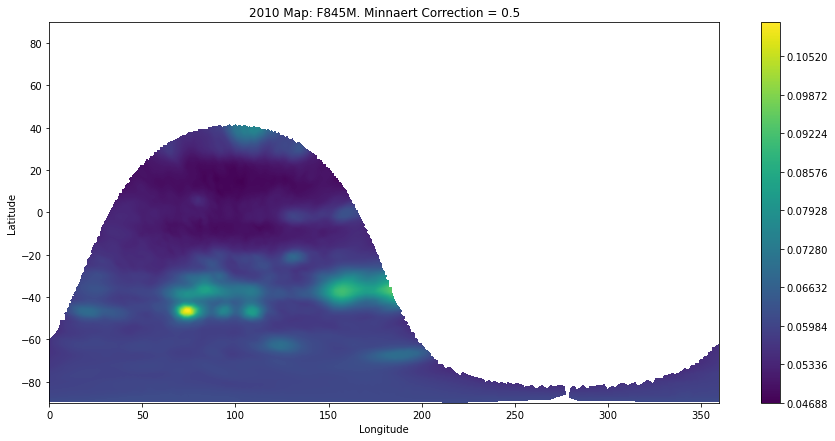

16

In [50]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2010/845/ib2s54b5q_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1023.65)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2010 Map: F845M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2010/845_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2010/845_1.fits')

writer845.writerow([float(hdr['EXPSTART'])])

# Year 2009 
Filters Available:-
- F467M
- F547M
- FQ619N
- FQ727N
- F845M

snapshot, 1 image for first 4 filters, and then 12 for F845M, as in the year 2010. 

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


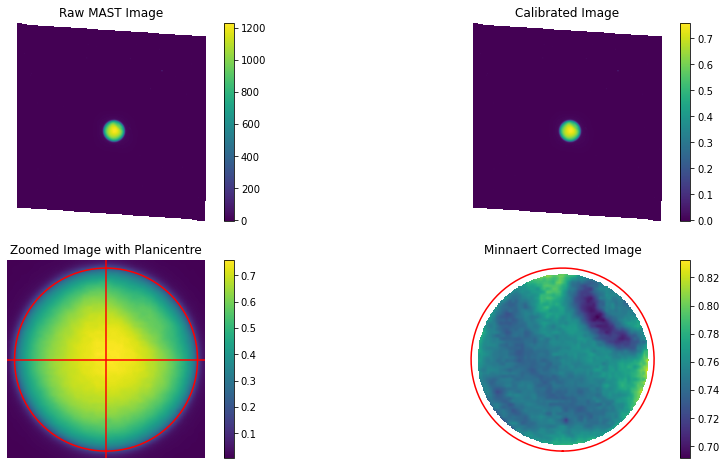

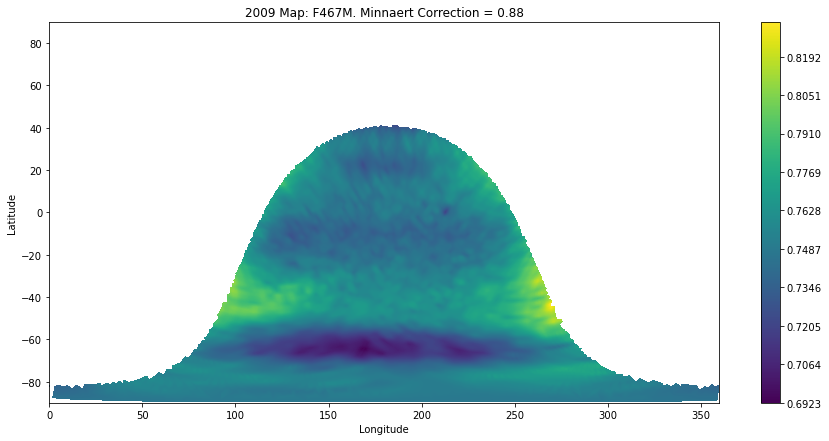

16

In [51]:
mfac = 0.88

img, hdr, scihdr = open_img('data/2009/467/ib2s04jvq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 2019.04)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2009 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2009/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2009/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


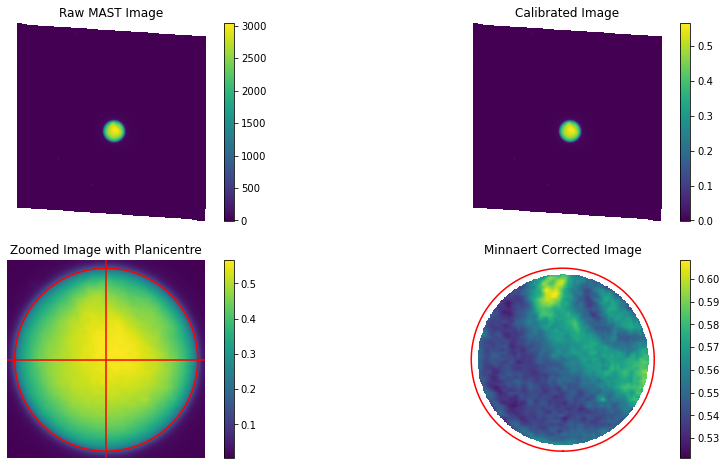

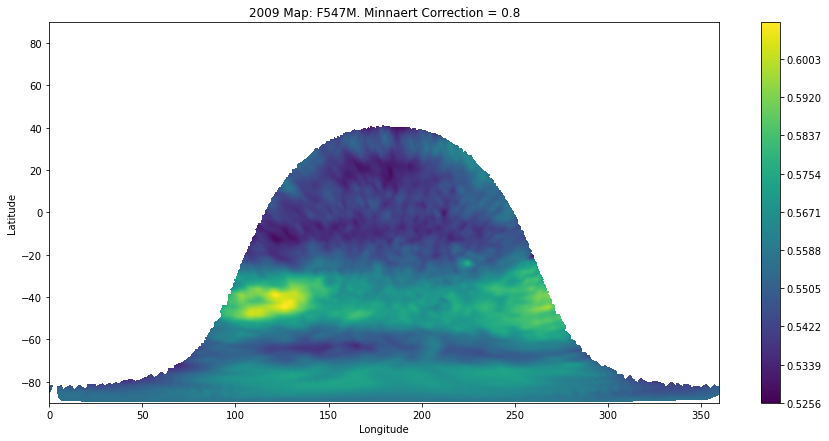

16

In [52]:
mfac = 0.8

img, hdr, scihdr = open_img('data/2009/547/ib2s04jwq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1859.82)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2009 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2009/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2009/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


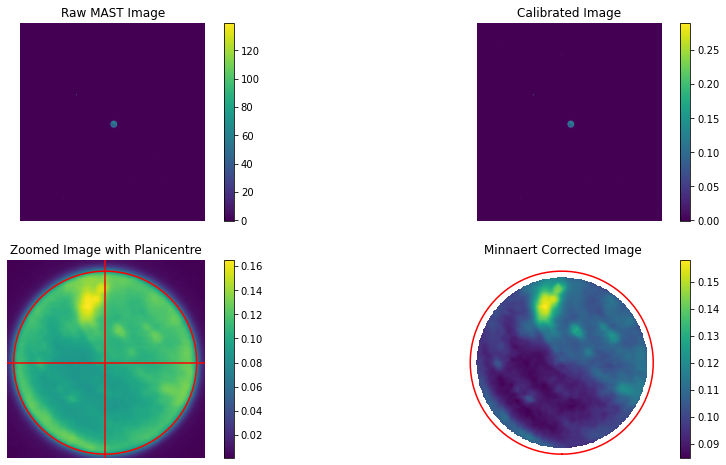

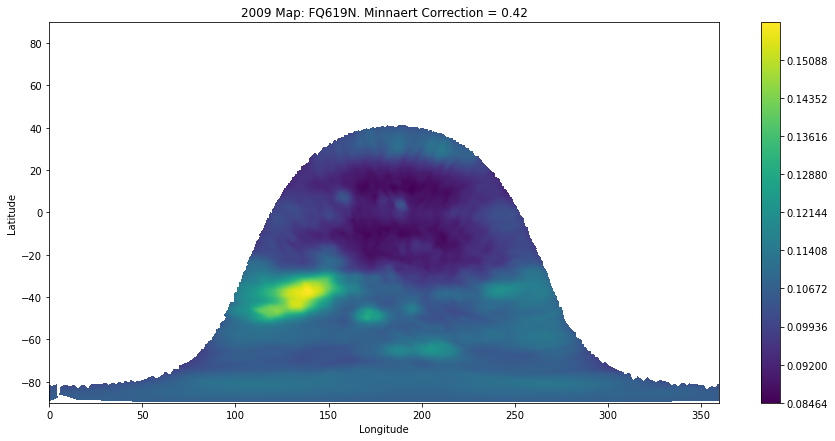

16

In [53]:
mfac = 0.42

img, hdr, scihdr = open_img('data/2009/619/ib2s04jzq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1707.85)
 
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4
    
plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2009 Map: FQ619N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2009/619_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2009/619_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


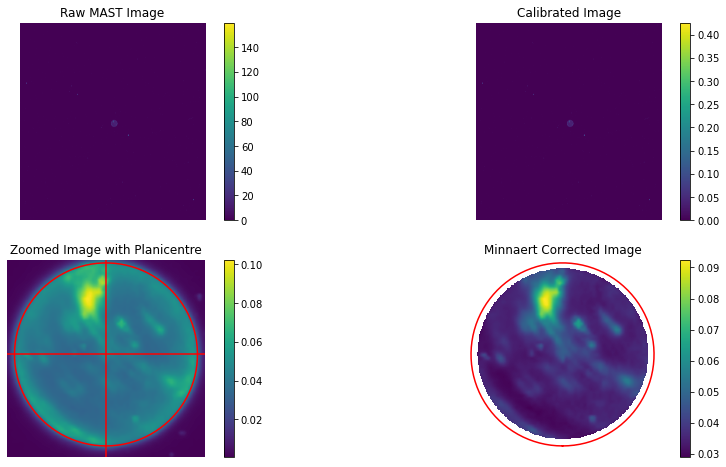

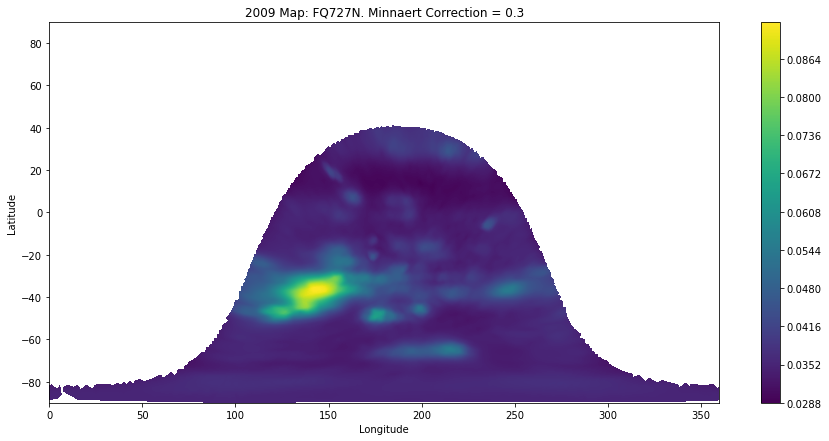

16

In [54]:
mfac = 0.3

img, hdr, scihdr = open_img('data/2009/727/ib2s04k1q_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1339.23)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2009 Map: FQ727N. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2009/727_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2009/727_1.fits')

writer727.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in sqrt
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*

.


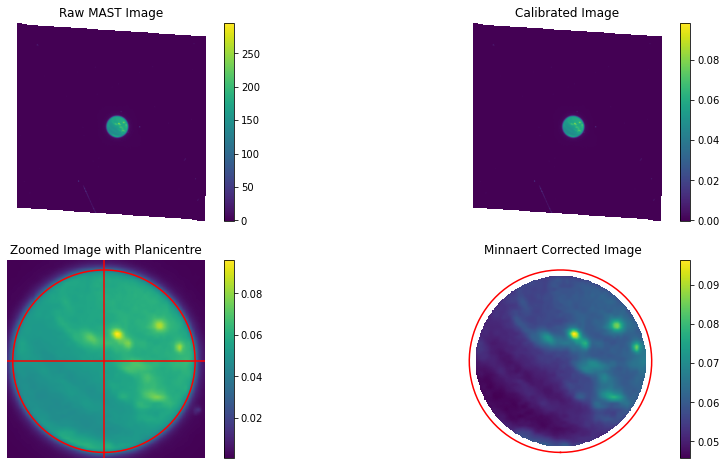

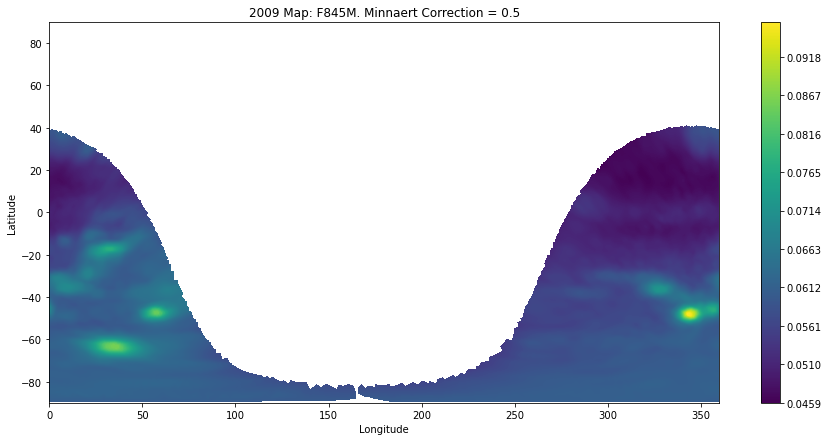

16

In [55]:
mfac = 0.5

img, hdr, scihdr = open_img('data/2009/845/ib2s06kaq_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], hdr['PHOTFLAM'], 1023.65)

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2009 Map: F845M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2009/845_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2009/845_1.fits')

writer845.writerow([float(hdr['EXPSTART'])])

# Year 2008, Last Year of WFPC2/PC Data

Filters Available:- 
- F467M
- F547M 

- FQCH4N15 (Filter not used before, as was only on WFPC2. More frequent methane band coverage in WFPC2 years. lets 619nm light through, about half the width of the FQ619N filter from later years)

NOTE:- This is the First Year I am processing from WFPC2, Note plate scale change (needs defining to be 0.0455 arcsec)
In addition to this, the images are no longer being pulled from the HST pipeline directly, as that outputs in c0f and c1f fits files. Therefore I have been pulling drz files from the HLA mission on the MAST archive. This year housed a full rotation, CH4 band filter showed no cirrus clouds in the "47" images, so they have been used.

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


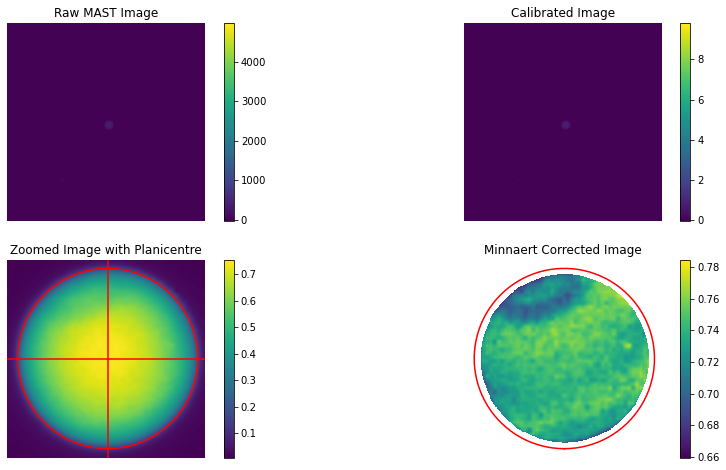

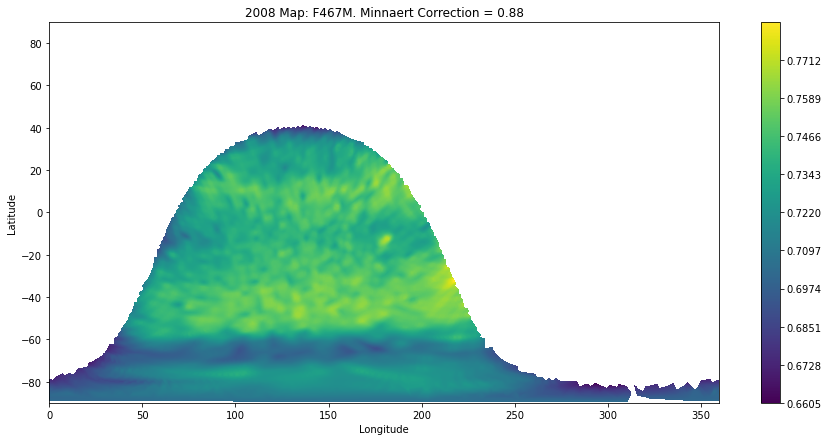

16

In [56]:
mfac = 0.88
img, hdr, scihdr = open_img('data/2008/467/hst_11156_47_wfpc2_f467m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 2019.07, PlateScale = 0.05, Filter = '467')

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2008 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2008/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2008/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


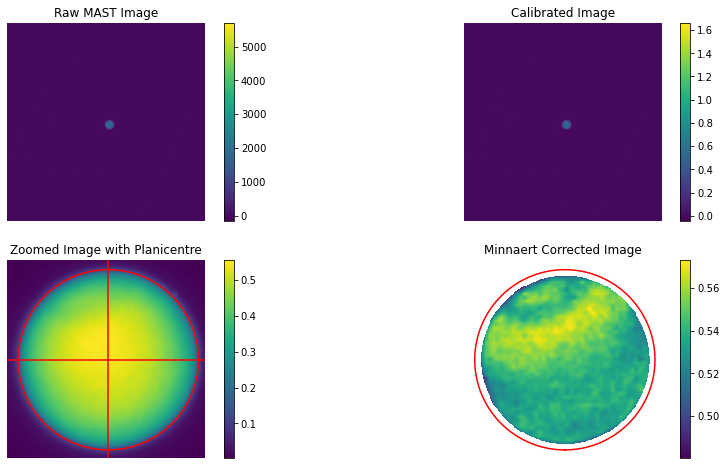

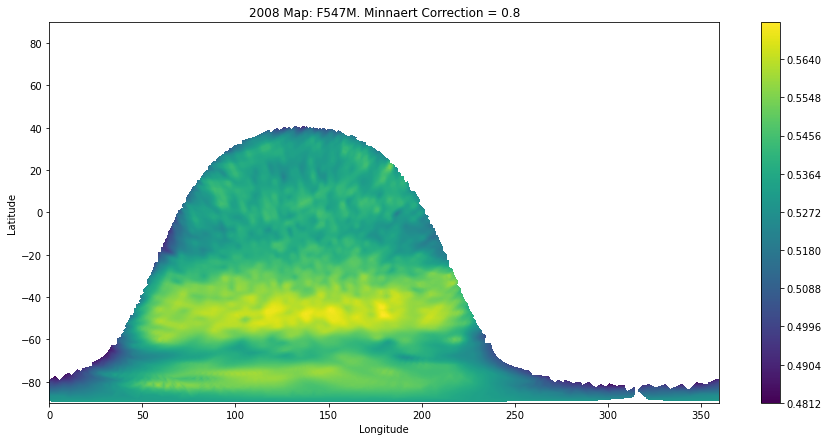

16

In [57]:
mfac = 0.8
img, hdr, scihdr = open_img('data/2008/547/hst_11156_47_wfpc2_f547m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1860.93, PlateScale = 0.05, Filter ='547')

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2008 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2008/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2008/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


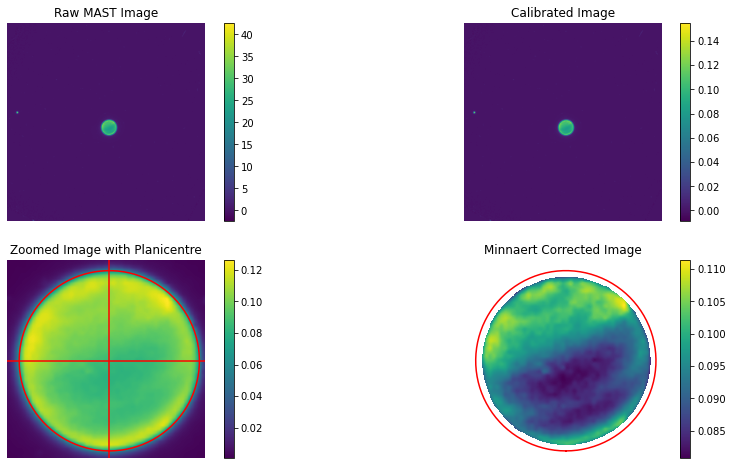

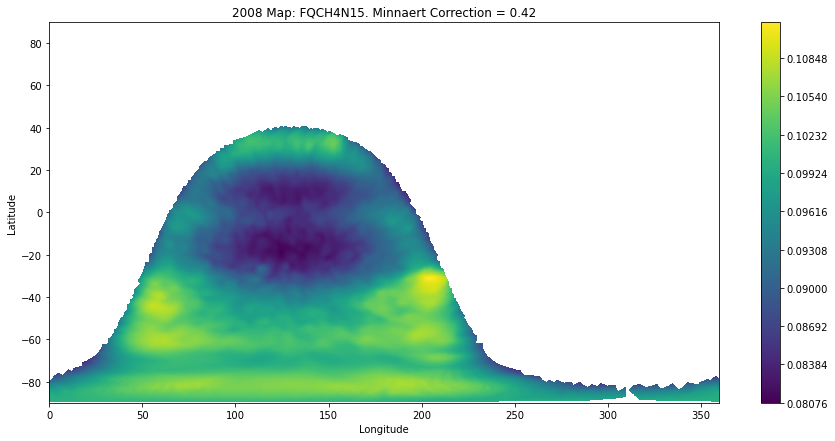

16

In [58]:
mfac = 0.42
img, hdr, scihdr = open_img('data/2008/ch4/hst_11156_47_wfpc2_fqch4n15_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1710.18, PlateScale = 0.05, Filter = '619')

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2008 Map: FQCH4N15. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2008/CH4_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2008/CH4_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

# Year 2007

Filters Available:- 
- F467M
- F547M 
- FQCH4N15

- Only one imageset was taken this year, data is what it is

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


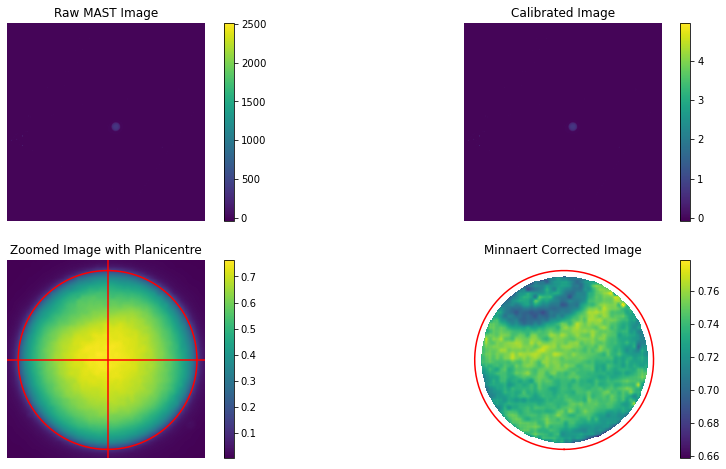

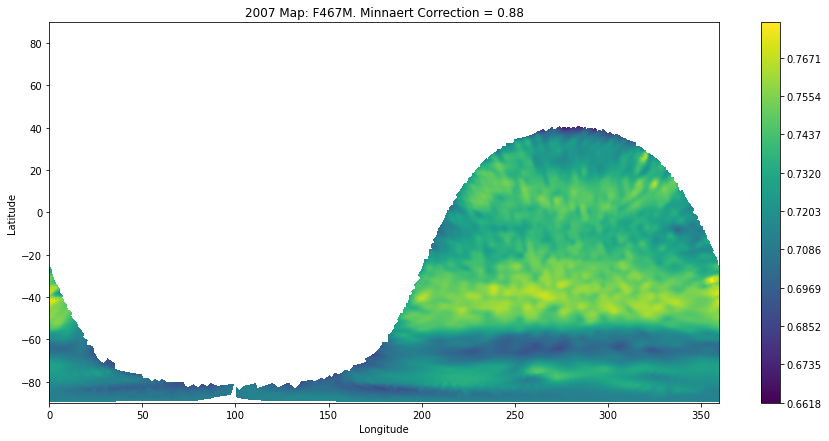

16

In [59]:
mfac = 0.88
img, hdr, scihdr = open_img('data/2007/467/hst_11156_03_wfpc2_f467m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 2019.07, PlateScale = 0.05, Filter = '467')

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2007 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2007/467_1.png')
plt.close()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude', fontsize=28)
plt.xticks(fontsize=28)
plt.ylim([-90,45])
plt.yticks(fontsize=28)
plt.ylabel('Latitude', fontsize=28)
plt.savefig('maps/2007/467_1.png', bbox_inches = 'tight', facecolor = 'white')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2007/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


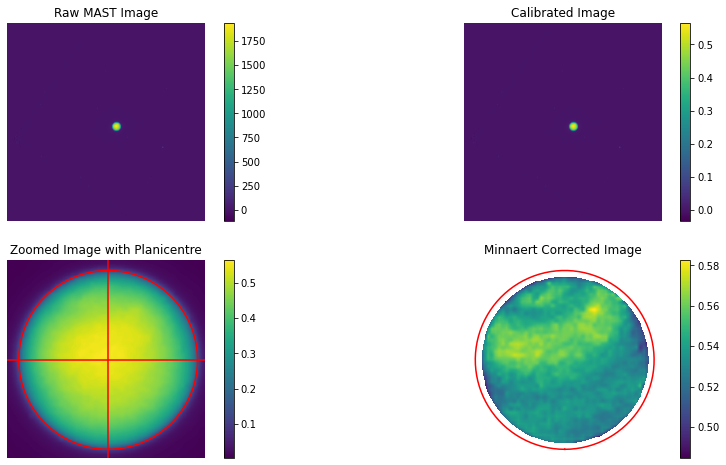

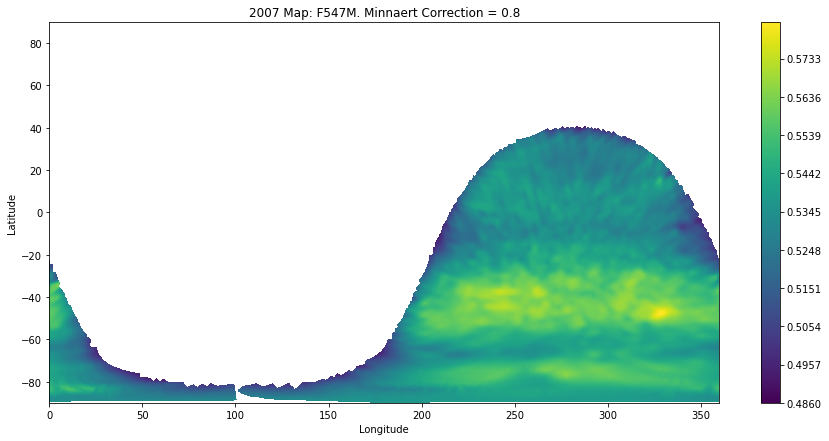

16

In [60]:
mfac = 0.8
img, hdr, scihdr = open_img('data/2007/547/hst_11156_03_wfpc2_f547m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1860.93, PlateScale = 0.05, Filter ='547')

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2007 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2007/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2007/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2*np.pi)  # ensure values are in expected range


.


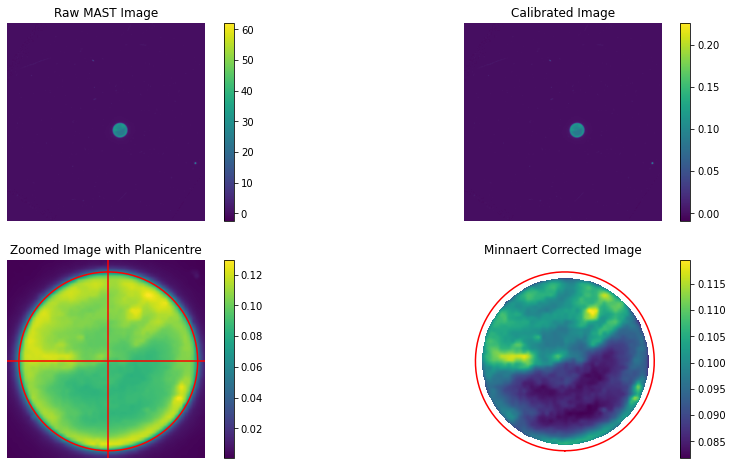

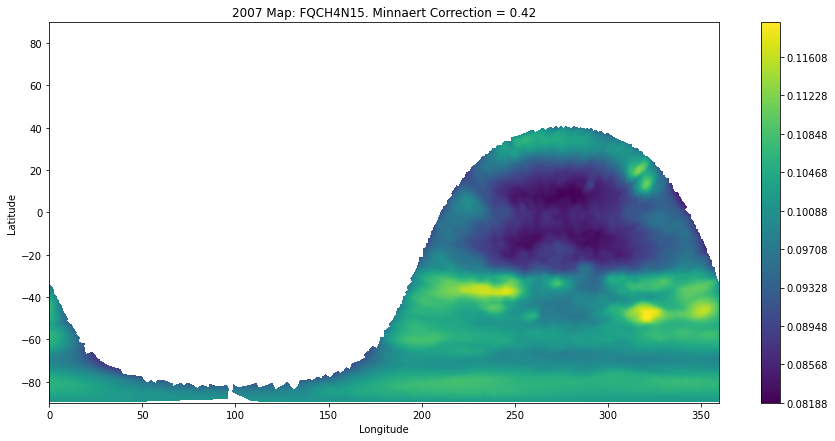

16

In [61]:
mfac = 0.42
img, hdr, scihdr = open_img('data/2007/ch4/hst_11156_03_wfpc2_fqch4n15_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1710.18, PlateScale = 0.05, Filter = '619')

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2007 Map: FQCH4N15. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude', fontsize=28)
plt.xticks(fontsize=28)
plt.ylim([-90,45])
plt.yticks(fontsize=28)
plt.ylabel('Latitude', fontsize=28)
plt.savefig('maps/2007/CH4_1.png', bbox_inches = 'tight', facecolor = 'white')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2007/CH4_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

# Year 2006

Filters Available:- 
- F467M
- F547M
- FQCH4N15

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


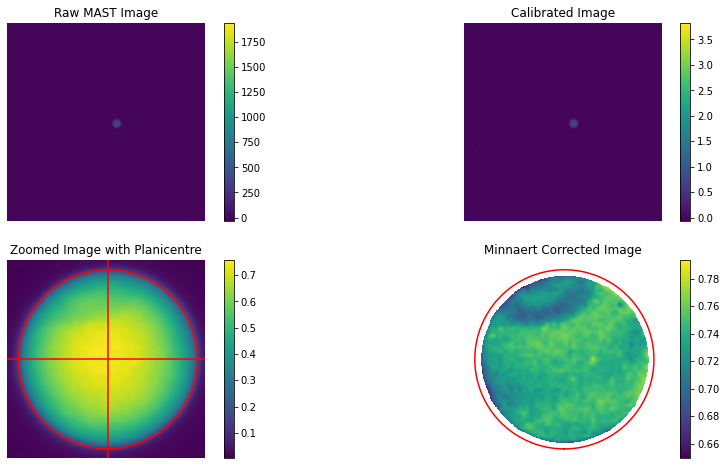

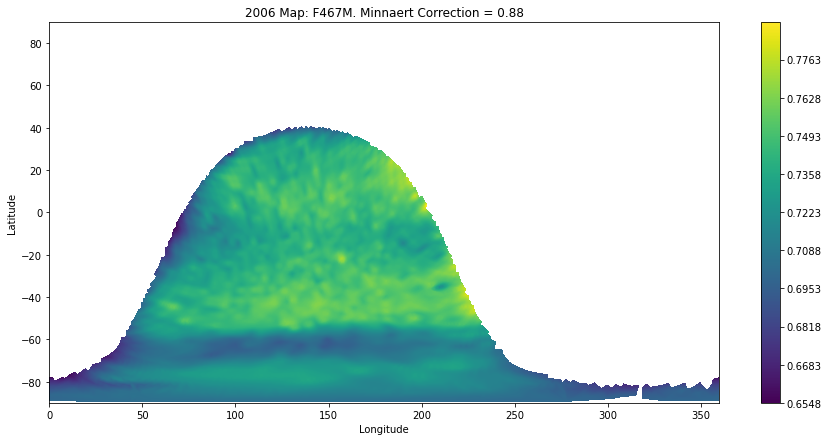

16

In [62]:
mfac = 0.88
img, hdr, scihdr = open_img('data/2006/467/hst_10534_19_wfpc2_f467m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 2019.07, PlateScale = 0.05, Filter = '467')

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2006 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2006/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2006/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


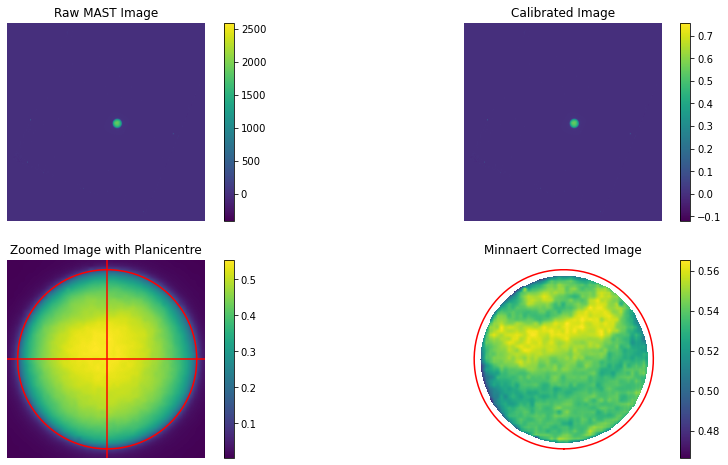

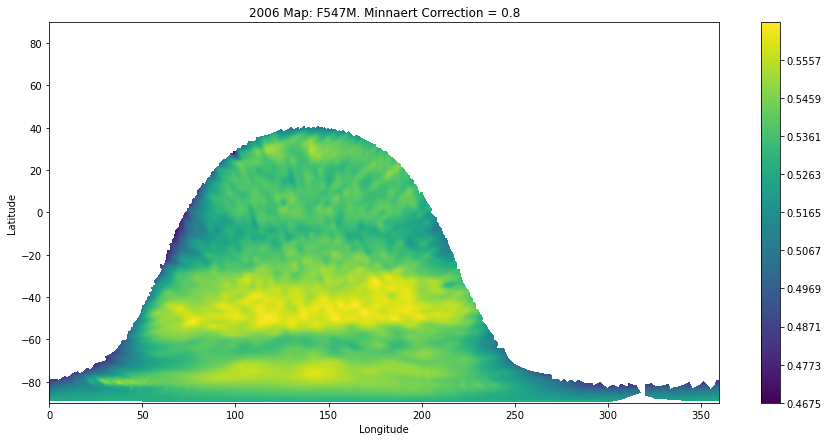

15

In [63]:
mfac = 0.8
img, hdr, scihdr = open_img('data/2006/547/hst_10534_19_wfpc2_f547m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1860.93, PlateScale = 0.05, Filter ='547')

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2006 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2006/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2006/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


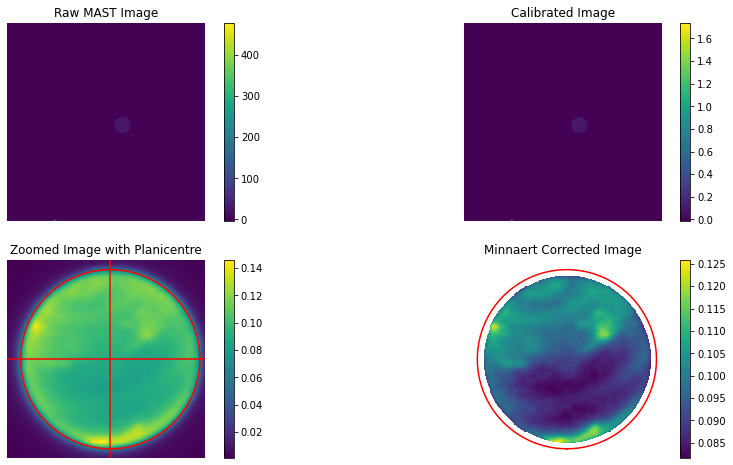

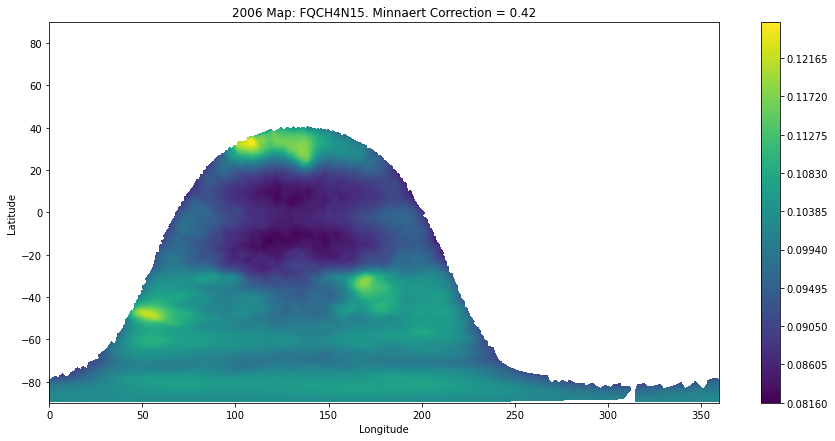

16

In [64]:
mfac = 0.42
img, hdr, scihdr = open_img('data/2006/ch4/hst_10534_19_wfpc2_fqch4n15_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1710.18, PlateScale = 0.05, Filter = '619')

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2006 Map: FQCH4N15. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2006/CH4_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2006/CH4_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

# Year 2005

Filters Available:- 
- F467M
- F547M
- FQCH4N15

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


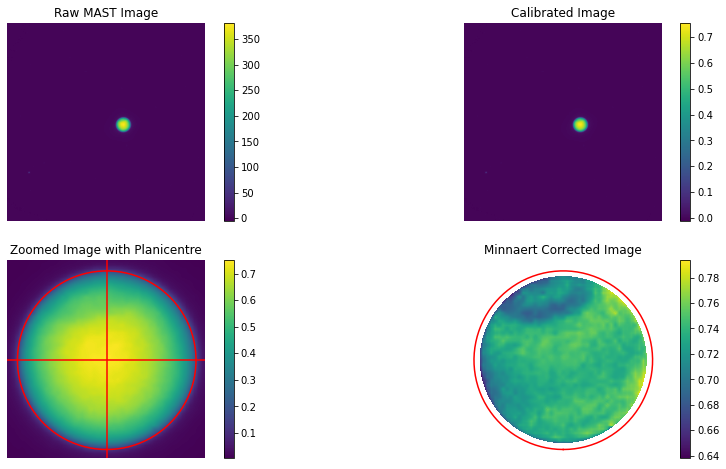

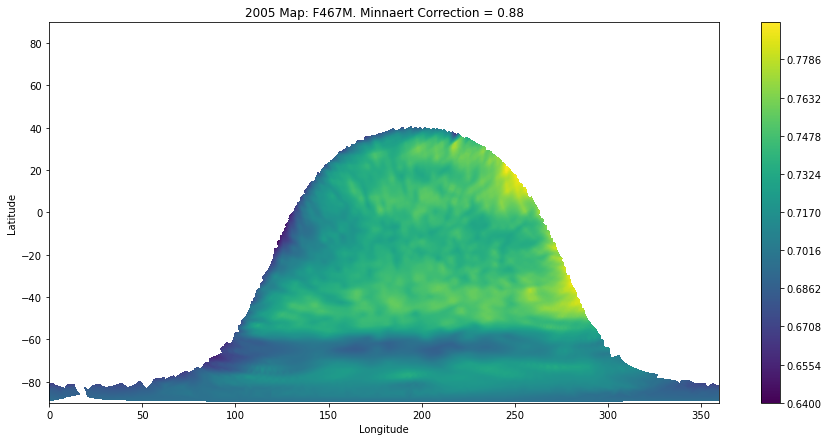

16

In [65]:
mfac = 0.88
img, hdr, scihdr = open_img('data/2005/467/hst_10170_11_wfpc2_f467m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 2019.07, PlateScale = 0.05, Filter = '467')

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad,2)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2005 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2005/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2005/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


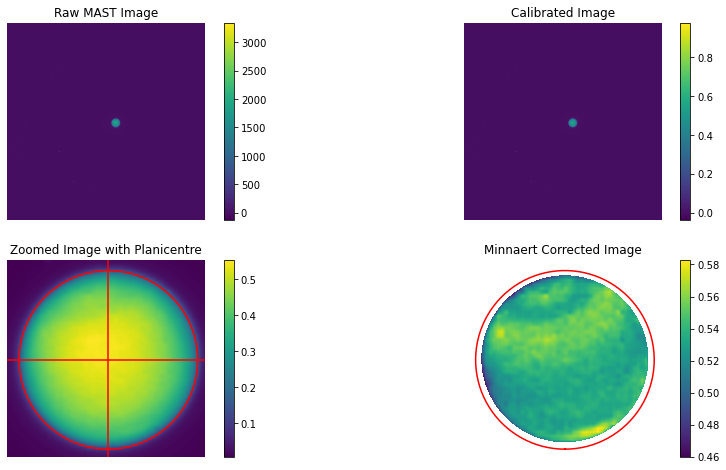

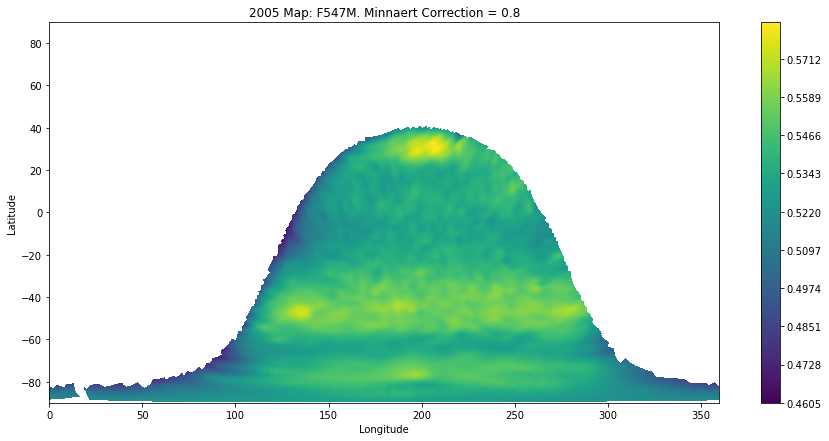

16

In [66]:
mfac = 0.8
img, hdr, scihdr = open_img('data/2005/547/hst_10170_11_wfpc2_f547m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1860.93, PlateScale = 0.05, Filter ='547')

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2005 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2005/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2005/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


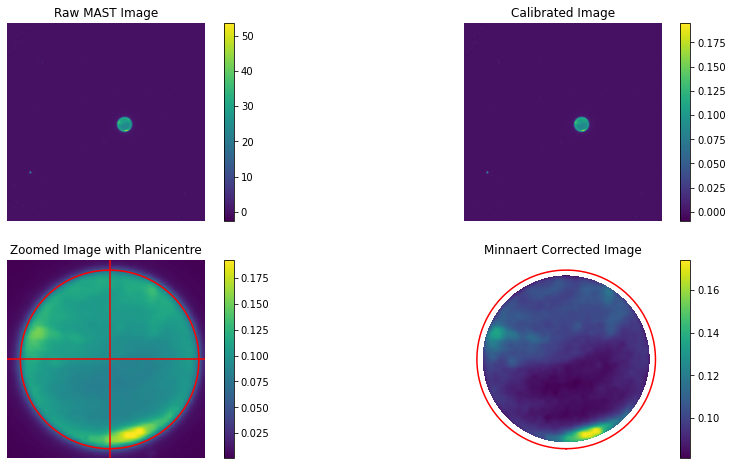

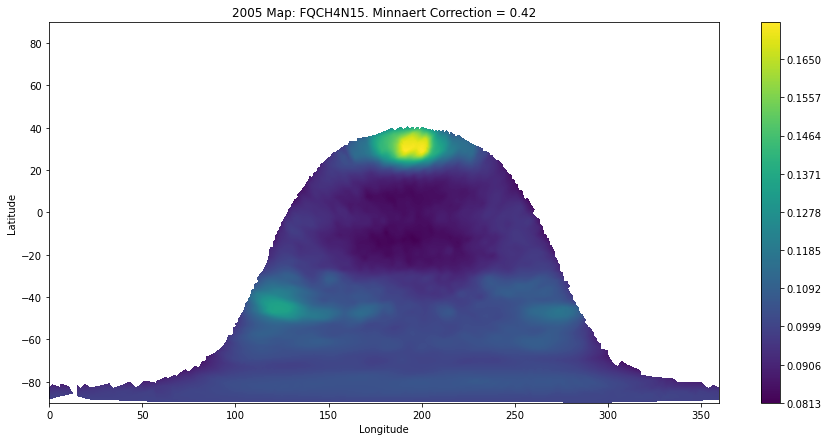

16

In [67]:
mfac = 0.42
img, hdr, scihdr = open_img('data/2005/ch4/hst_10170_11_wfpc2_fqch4n15_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1710.18, PlateScale = 0.05, Filter = '619')

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2005 Map: FQCH4N15. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2005/CH4_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2005/CH4_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

# Year 2004

Filters Available:-
- F467M
- F547M
- FQCH4N15

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


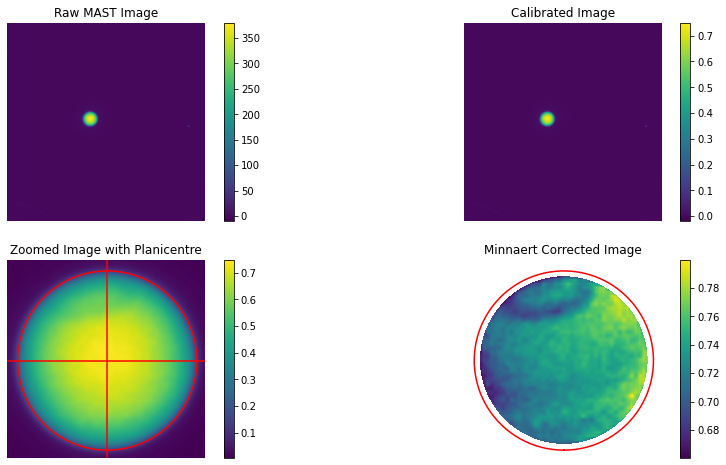

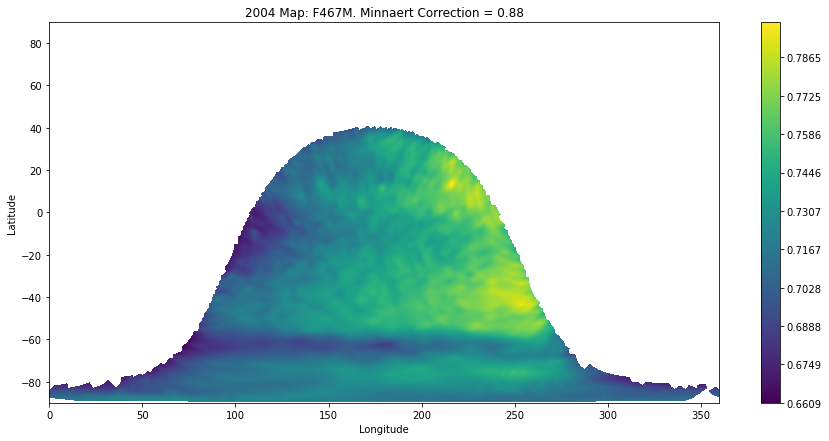

16

In [68]:
mfac = 0.88
img, hdr, scihdr = open_img('data/2004/467/hst_10170_15_wfpc2_f467m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 2019.07, PlateScale = 0.05, Filter = '467')

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad,2)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2004 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2004/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2004/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


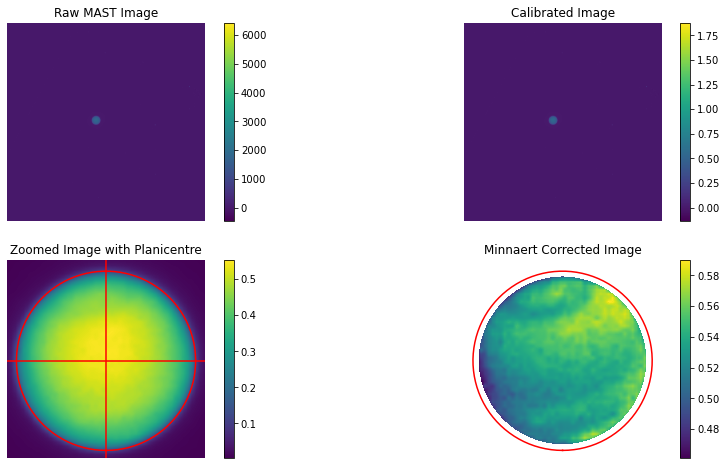

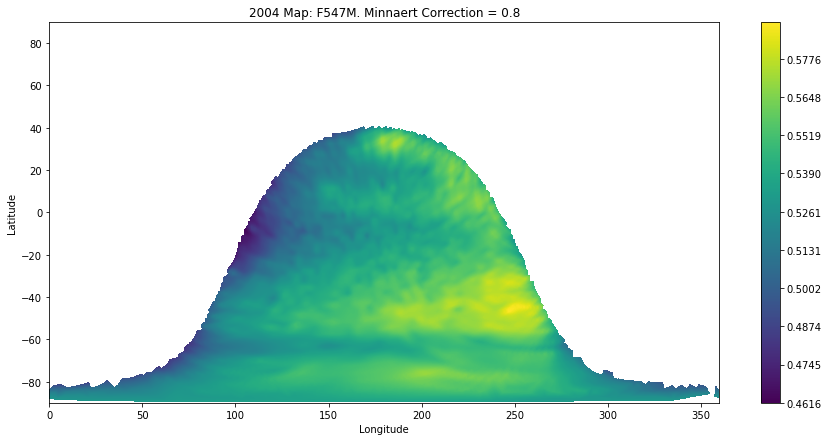

16

In [69]:
mfac = 0.8
img, hdr, scihdr = open_img('data/2004/547/hst_10170_15_wfpc2_f547m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1860.93, PlateScale = 0.05, Filter ='547')

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2004 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2004/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2004/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


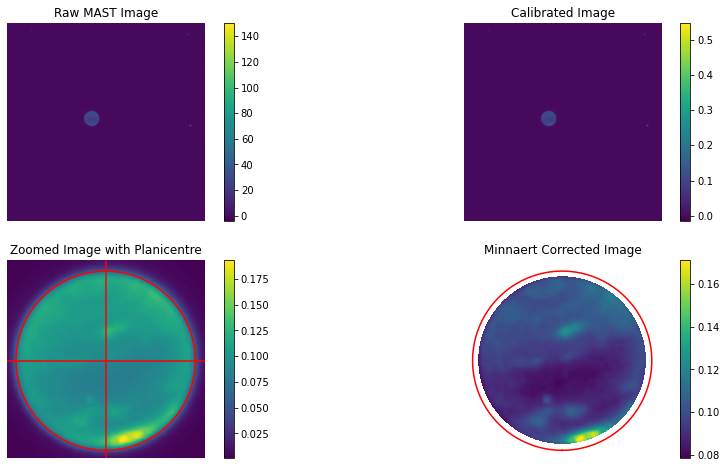

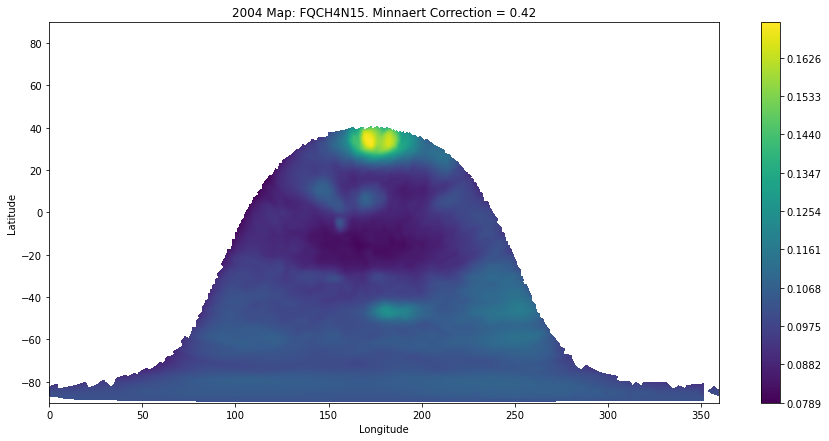

16

In [70]:
mfac = 0.42
img, hdr, scihdr = open_img('data/2004/ch4/hst_10170_15_wfpc2_fqch4n15_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1710.18, PlateScale = 0.05, Filter = '619')

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2004 Map: FQCH4N15. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2004/CH4_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2004/CH4_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

# Year 2001
Year 2003 sadly didn't have any data taken, and Year 2002 looks VERY broken (see Opening WFPC2 Images). Therefore I have skipped to Year 2001. 

Filters Available:- 
- F467M
- F547M
- FQCH4N15

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


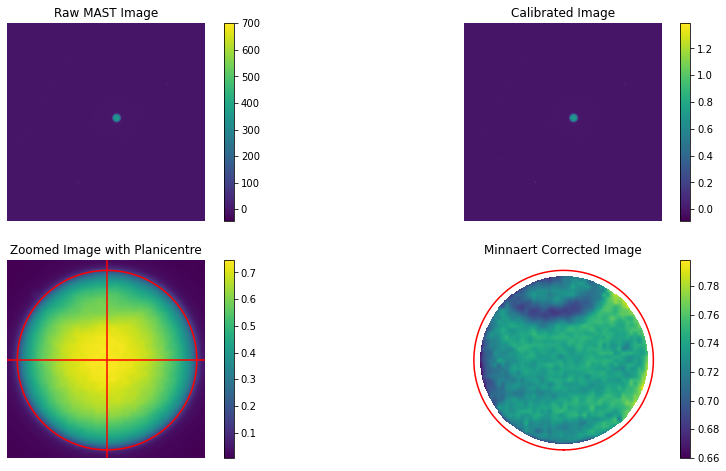

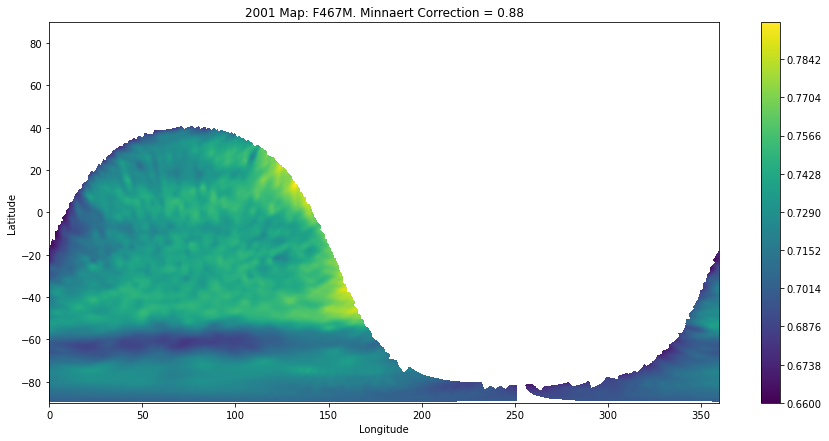

16

In [71]:
mfac = 0.88
img, hdr, scihdr = open_img('data/2001/467/hst_08634_14_wfpc2_f467m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 2019.07, PlateScale = 0.05, Filter = '467')

#img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
#img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad,2)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2001 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2001/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2001/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


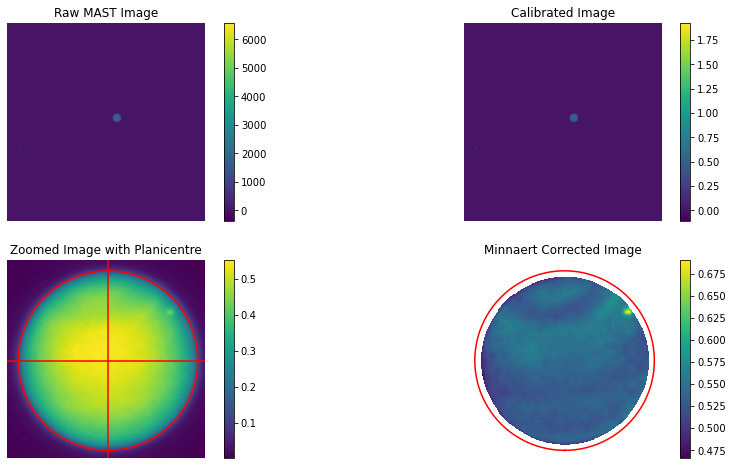

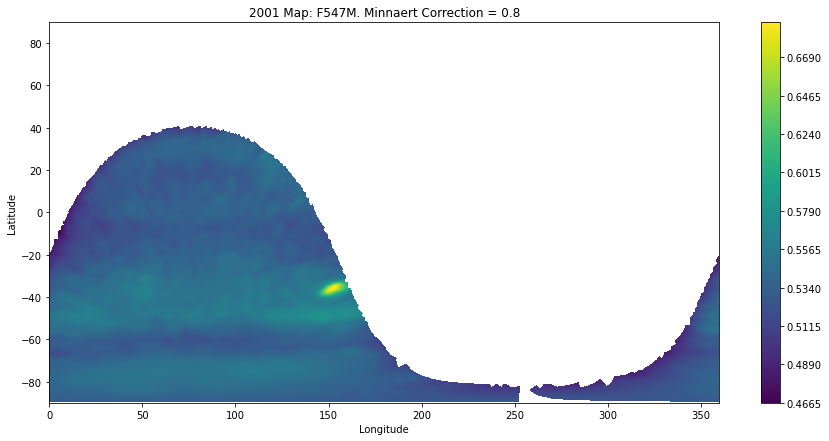

16

In [72]:
mfac = 0.8
img, hdr, scihdr = open_img('data/2001/547/hst_08634_14_wfpc2_f547m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1860.93, PlateScale = 0.05, Filter ='547')

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2001 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2001/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2001/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


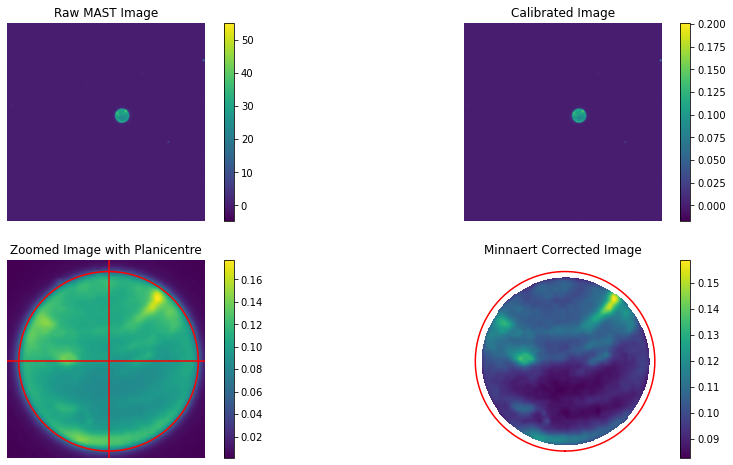

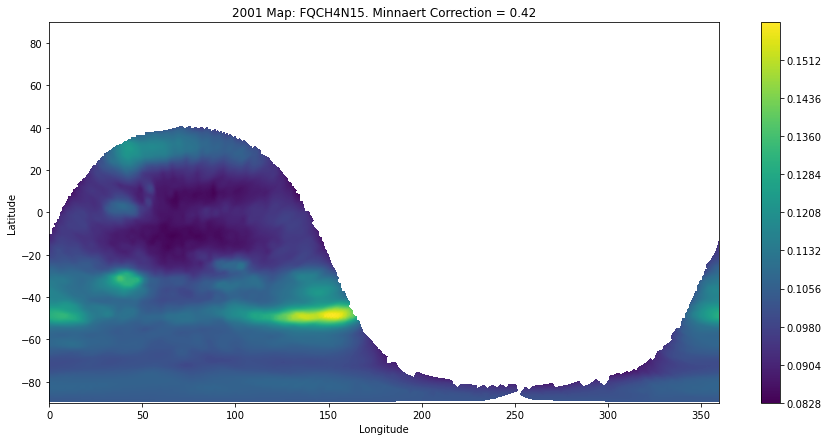

16

In [73]:
mfac = 0.42
img, hdr, scihdr = open_img('data/2001/ch4/hst_08634_14_wfpc2_fqch4n15_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1710.18, PlateScale = 0.05, Filter = '619')

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2001 Map: FQCH4N15. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2001/CH4_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2001/CH4_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])

# Year 2000

Filters Available:-
- F467M
- F547M
- FQCH4N15

51840.05292886


C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


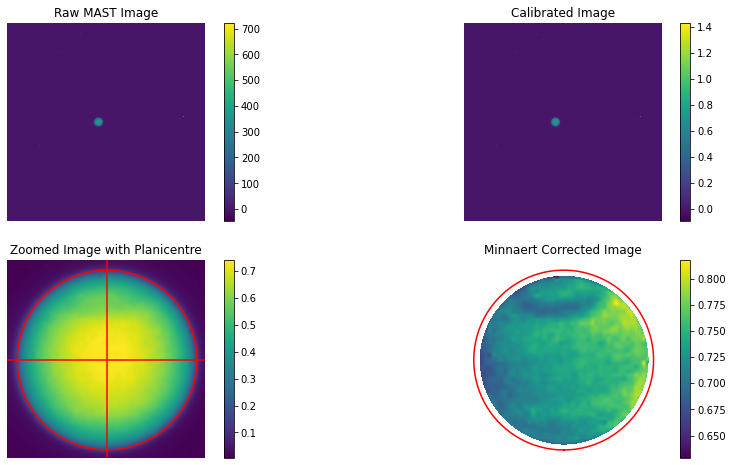

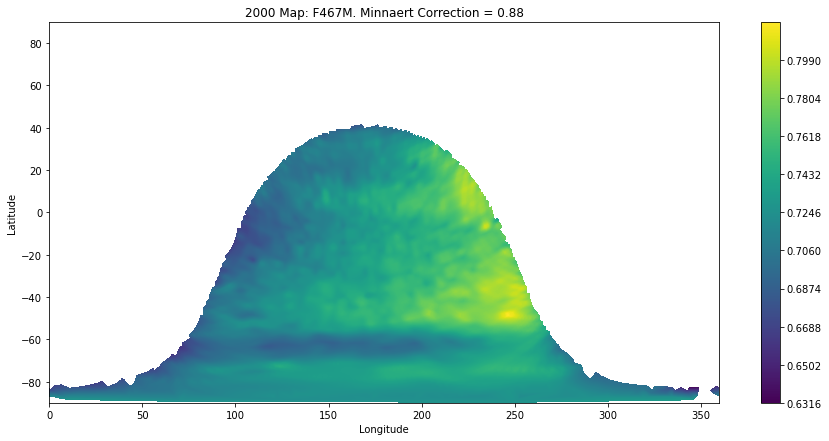

16

In [74]:
mfac = 0.88
img, hdr, scihdr = open_img('data/2000/467/hst_08634_08_wfpc2_f467m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])
print(hdr['EXPSTART'])
IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 2019.07, PlateScale = 0.05, Filter = '467')

#img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
#img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad,2)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2000 Map: F467M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2000/467_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2000/467_1.fits')

writer467.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


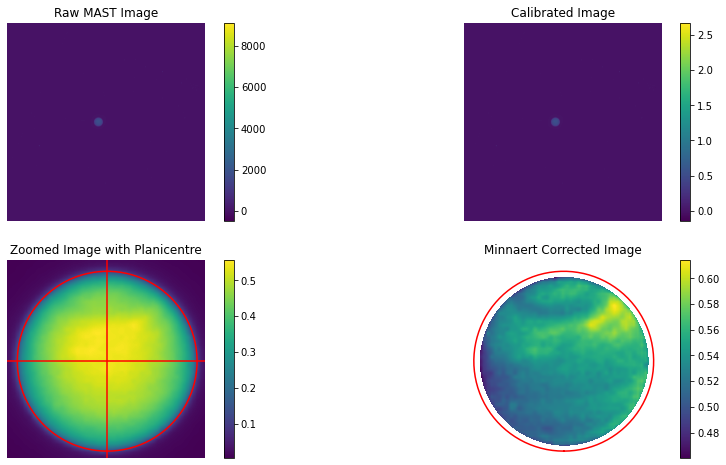

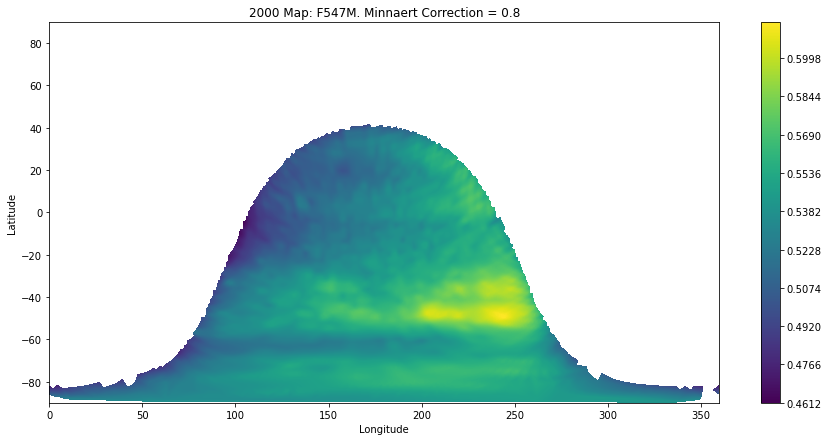

16

In [75]:
mfac = 0.8
img, hdr, scihdr = open_img('data/2000/547/hst_08634_08_wfpc2_f547m_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1860.93, PlateScale = 0.05, Filter ='547')

img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2000 Map: F547M. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2000/547_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2000/547_1.fits')

writer547.writerow([float(hdr['EXPSTART'])])

C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\MapFunc.py:117: RuntimeWarning: invalid value encountered in power
  img_corr = img/((mu**(k-1))*(mu0**k))
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:331: RuntimeWarning: invalid value encountered in sqrt
  z_img = np.sqrt(1 - x_img**2 - y_img**2)
C:\Users\jamie\Documents\Uni Work\Year 4\PA4900 Specialist Research Project\CODE AHHHHHHH\Neptune from Scratch\IMAGE MAPPING\Final Mappings\tools\mapping.py:527: RuntimeWarning: invalid value encountered in remainder
  long_img = long_img % (2

.


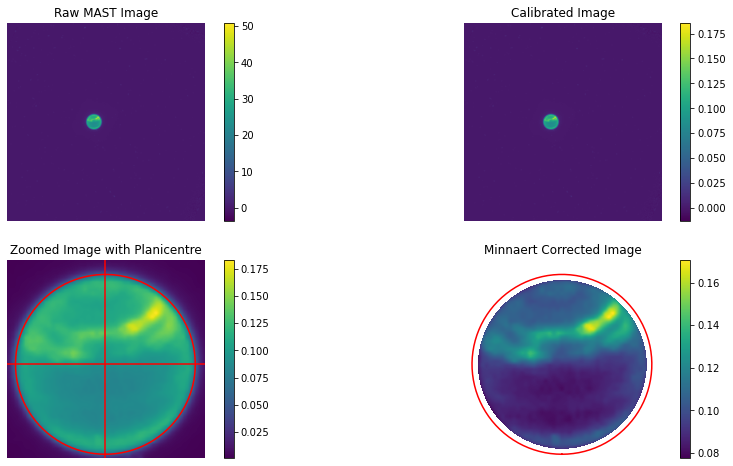

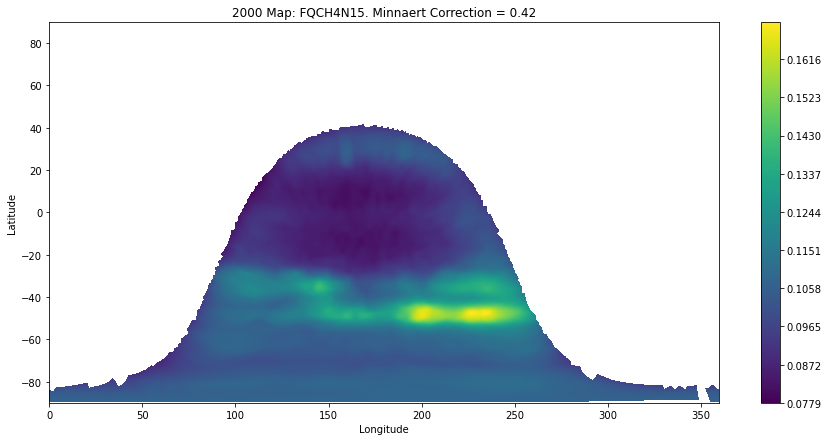

15

In [76]:
mfac = 0.42
img, hdr, scihdr = open_img('data/2000/ch4/hst_08634_08_wfpc2_fqch4n15_pc_drz.fits')
eph = get_ephemerides(target='neptune',loc='hst',epoch=hdr['EXPSTART'])

IF, pltscl = calc_IF(eph['r'], scihdr['PHOTFLAM'], 1710.18, PlateScale = 0.05, Filter = '619')

img = img[200:(img.shape[0]-200),200:(img.shape[1]-200)]
img = tools.image.exp_despike(img)
img = interp_image(img,4) #interpolate image to have higher resolution, rest of the block deals with the consequences of this
pltscl = pltscl/4

plt.figure(figsize=(15,8))
ax1 = plt.subplot(221)
im = ax1.imshow(img, cmap=col)
plt.title('Raw MAST Image')
plt.colorbar(im)
ax1.axis('off')

img = img*IF

ax2 = plt.subplot(222)
im2 = ax2.imshow(img, cmap=col)
plt.title('Calibrated Image')
plt.colorbar(im2)
ax2.axis('off')

rad = float(eph['ang_width'])/(2*pltscl)
img, y, x = circ(img,rad)
img, planicentre = get_planicentre(img,rad)

ax3 = plt.subplot(223)
im3 = ax3.imshow(img, cmap=col)
plt.title('Zoomed Image with Planicentre')
ax3.axhline(planicentre[1],color=xcol)
ax3.axvline(planicentre[0],color=xcol)
ax3.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im3)
ax3.axis('off')

img = minnaert(img, planicentre, mfac, eph)

ax4 = plt.subplot(224)
im4 = ax4.imshow(img, cmap=col)
plt.title('Minnaert Corrected Image')
#ax4.axhline(planicentre[1],color=xcol)
#ax4.axvline(planicentre[0],color=xcol)
ax4.plot(x+planicentre[0], y+planicentre[1],color=xcol)
plt.colorbar(im4)
ax4.axis('off')

ang_corr = float(scihdr['ORIENTAT'])-float(eph['NPole_ang']) #the angle with which to correct the north pole of the image

mapped_img = map_observation(img, planicentre[0], planicentre[1], planicentre[2], ang_corr, eph['PDObsLon'], eph['PDObsLat'])

plt.figure(figsize=(15,7))
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('2000 Map: FQCH4N15. Minnaert Correction = '+str(mfac))
plt.colorbar()
plt.show()

flipped_img = np.flip(mapped_img[0],0)

#plt.figure(figsize=(15,14))
#ax1 = plt.subplot(211)
#ax1.imshow(mapped_img[0])
#ax2 = plt.subplot(212)
#ax2.imshow(flipped_img)
#plt.show()

#Save the Plot to a File
plt.figure(figsize=(15,7)) #saves the map to a .png to possibly be used in my report
plt.contourf(mapped_img[1], mapped_img[2], mapped_img[0],levels=lvls)
plt.axis('off')
plt.savefig('maps/2000/CH4_1.png')
plt.close()

hdu = ast.PrimaryHDU(flipped_img) #saves the map to a fits image to be read by the reflectance plotter#
hdu.writeto('maps/2000/CH4_1.fits')

writer619.writerow([float(hdr['EXPSTART'])])